# figures paper from HyDrop and 10x object together

In [1]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.patches import Patch
import h5py
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
# 220 topics, all data (also not-dechor)
import gzip
import pickle

# Define the path to the gzipped pickle file
gzip_pickle_path = '/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/HyDrop_10x_otsu_notdownsampled/cistopic_objs/cistopic_obj_otsu_embryo_all_LCB_embryo_dechor_consensusupeaks_05082024_220topics.pkl.gz'

# Open and load the gzipped pickle file
with gzip.open(gzip_pickle_path, 'rb') as infile:
    cistopic_obj = pickle.load(infile)

In [4]:
print(cistopic_obj)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 607330 × 95819


In [4]:
cistopic_obj.projections

{'cell': {'UMAP':                                                        UMAP_1     UMAP_2
  CTCGATATCTGCTCGTTCATGATCTAGGTA___FDM__0a2768__2...  14.616487  10.986987
  CTACGCTGATCTGATTATGTTAATCGCACA___FDM__0a2768__2...  13.134726  11.206231
  GTTACCGCTCGGACCAAGTGTGGCTTAACA___FDM__0a2768__2...   8.673392   9.412356
  GAAGCCTAGTCCGTACCTATCCTGCCTATT___FDM__0a2768__2...   7.915528   0.662986
  AGCATGGAACTTCGCTATGTACCTGAGATG___FDM__0a2768__2...  11.217761   6.430166
  ...                                                       ...        ...
  TGTTGTGACAGTGCGGTGTAACTTGCTACA___FDM__01cd58__2...   9.754686   6.572958
  TCTTGGAATGCTGATTATGTGGACTATACT___FDM__01cd58__2...   7.510726  12.604239
  ACGGTGCTTGTCGCCTAAGTTCTGGAAGCC___FDM__01cd58__2...   8.426187   2.204091
  TCAACGTCACCACCGTTCTTTCGGAGTGAC___FDM__01cd58__2...  10.244380  10.145671
  TATAGTCACCCAGCACATAGTTGGCTTGAC___FDM__01cd58__2...  10.412505  13.876888
  
  [607330 rows x 2 columns],
  'tSNE':                                           

In [5]:
cistopic_obj.cell_data.columns

Index(['cisTopic_log_nr_frag', 'cisTopic_nr_frag', 'cisTopic_log_nr_acc',
       'cisTopic_nr_acc', 'Log_total_nr_frag', 'Log_unique_nr_frag',
       'Total_nr_frag', 'Unique_nr_frag', 'Dupl_nr_frag', 'Dupl_rate',
       'Total_nr_frag_in_regions', 'Unique_nr_frag_in_regions', 'FRIP',
       'TSS_enrichment', 'sample_id',
       'kde__log_Unique_nr_frag_in_regions__TSS_enrichment',
       'kde__log_Unique_nr_frag_in_regions__FRIP',
       'kde__log_Unique_nr_frag_in_regions__Dupl_rate', 'barcode',
       'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2',
       'pycisTopic_leiden_10_1.6', 'pycisTopic_leiden_10_2',
       'annotations_big_embryo_atlas_20062024',
       'annotations_big_embryo_atlas_12082024',
       'annotations_big_embryo_atlas_13082024',
       'annotations_big_embryo_atlas_15082024', 'tech_details',
       'annotations_big_embryo_atlas_15082024_broad', 'tech', 'dechor',
       'annotations_big_embryo_atlas_09092024_broad',
       'annotations_big_embryo_atlas_09

## counting

In [6]:
sample_counts = cistopic_obj.cell_data['tech'].value_counts().to_dict()
print(sample_counts)

{'HyDrop_v2': 340604, '10x_v2': 266726}


In [7]:
sample_counts = cistopic_obj.cell_data['final_embryo_annot_atlas_05112024'].value_counts().to_dict()
print(sample_counts)

{'NA_lowQ': 128264, 'Neuronal': 92588, 'Epidermis': 77676, 'Midgut': 69598, 'Fat_body': 37666, 'Somatic_muscles': 29700, 'Pharnyx': 22444, 'Neuroblasts': 18079, 'Primordium_all': 14397, 'Tracheal_system': 14377, 'Hindgut': 12264, 'PNS_sens_neurons': 11771, 'muscle_attachement_Stripe': 11356, 'Visceral_muscles': 11298, 'Glia': 10394, 'Salivary_gland': 9226, 'Malpighian_tubule': 8680, 'Yolk': 7459, 'Hemocytes': 7425, 'Head_Ectoderm': 7176, 'Midgut_acidification': 5492}


In [8]:
sample_counts = cistopic_obj.cell_data['sample_id'].value_counts().to_dict()
print(sample_counts)

{'FDM__4805c2__240116_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleS8': 66707, 'FDM__5260fa__240321_10xscATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF1': 66113, 'FDM__f83e74__240321_10xscATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF2': 64799, 'FDM__440342__240116_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleS7': 60394, 'FDM__15999e__240321_HyDropATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF5': 47258, 'FDM__ad7491__240321_HyDropATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF6': 41826, 'FDM__eda215__240321_HyDropATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF3': 27614, 'FDM__0cd23d__240321_HyDropATAC_Dros_DGRP_Embryo_16-20AEL_Dechor_sampleAF4': 23796, 'FDM__79eb57__240116_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleS1': 23119, 'FDM__23c6d3__240116_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleS6': 22849, 'FDM__5d36d3__240208_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleV1': 18932, 'FDM__ff0cf3__240116_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_sampleS2': 17895, 'FDM__15d2ea__240116_HyDropATAC_Dros_DGRP

In [5]:
tech_sample_counts = cistopic_obj.cell_data.groupby('tech_details')['sample_id'].nunique()
print(tech_sample_counts)

tech_details
10x_v2_Chromium_dechor       2
10x_v2_HyDrop_reagents       2
10x_v2_Onyx                  1
HyDrop_v2                   10
HyDrop_v2_dechor             4
HyDrop_v2_dechor_highTn5     4
Name: sample_id, dtype: int64


In [10]:
cluster_avg = cistopic_obj.cell_data.groupby('tech_details')['Unique_nr_frag_in_regions'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'Unique_nr_frag_in_regions']
print(table)

                       tech  Unique_nr_frag_in_regions
0          HyDrop_v2_dechor                1714.589771
1                 HyDrop_v2                1856.569821
2    10x_v2_Chromium_dechor                2824.334339
3    10x_v2_HyDrop_reagents                3539.723873
4  HyDrop_v2_dechor_highTn5                3964.784119
5               10x_v2_Onyx                4552.775508


In [11]:
cluster_avg = cistopic_obj.cell_data.groupby('tech_details')['TSS_enrichment'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'TSS_enrichment']
print(table)

                       tech  TSS_enrichment
0                 HyDrop_v2        2.447614
1    10x_v2_HyDrop_reagents        2.583167
2          HyDrop_v2_dechor        3.538737
3               10x_v2_Onyx        3.750558
4    10x_v2_Chromium_dechor        3.956921
5  HyDrop_v2_dechor_highTn5        4.554591


In [12]:
cluster_avg = cistopic_obj.cell_data.groupby('tech_details')['FRIP'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'FRIP']
print(table)

                       tech      FRIP
0  HyDrop_v2_dechor_highTn5  0.444763
1    10x_v2_Chromium_dechor  0.616589
2                 HyDrop_v2  0.666654
3          HyDrop_v2_dechor  0.708064
4               10x_v2_Onyx  0.735532
5    10x_v2_HyDrop_reagents  0.753508


In [13]:
cluster_avg = cistopic_obj.cell_data.groupby('tech')['Unique_nr_frag_in_regions'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'Unique_nr_frag_in_regions']
print(table)

        tech  Unique_nr_frag_in_regions
0  HyDrop_v2                2706.427758
1     10x_v2                3221.695800


In [14]:
cluster_avg = cistopic_obj.cell_data.groupby('tech')['Unique_nr_frag'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'Unique_nr_frag']
print(table)

        tech  Unique_nr_frag
0     10x_v2     4686.046486
1  HyDrop_v2     5242.141921


In [15]:
cluster_avg = cistopic_obj.cell_data.groupby('tech')['FRIP'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'FRIP']
print(table)

        tech      FRIP
0  HyDrop_v2  0.580887
1     10x_v2  0.685719


In [16]:
cluster_avg = cistopic_obj.cell_data.groupby('tech')['TSS_enrichment'].mean()
sorted_clusters = cluster_avg.sort_values()
table = sorted_clusters.reset_index()
table.columns = ['tech', 'TSS_enrichment']
print(table)

        tech  TSS_enrichment
0     10x_v2        3.295555
1  HyDrop_v2        3.468479


## color dicts

In [8]:
color_dict = {'tech':
              {'HyDrop_v2': '#E69F00', '10x_v2': '#0072B2'},

        'final_embryo_annot_atlas_05112024':
            {'Epidermis': '#E69F00', 
             'Midgut': '#009E73', 
             'Neuronal': '#CC79A7', 
             'Fat_body': '#F0E442', 
             'Neuroblasts': '#CC79A7', 
             'Somatic_muscles': '#84BC3D', 
             #'Neuronal_brain': '#CC79A7', 
             #'Neuronal_brain_visual_system_dev': '#CC79A7', 
             'Pharnyx': '#9772D3', 
             'Hindgut': '#009E73', 
             'muscle_attachement_Stripe': '#4C5BF2', 
             'Tracheal_system': '#0072B2', 
             'PNS_sens_neurons': '#CC79A7', 
             'Primordium_all': '#8B167D', 
             'Proventriculus': '#6A31EC', 
             'Glia': '#000000', 
             'Visceral_muscles': '#547953', 
             'Hemocytes': '#56B4E9', 
             'Head_Ectoderm': '#8B167D', 
             'Malpighian_tubule': '#E6A7E2',
             #'Endocrine_cells': '#28787B', 
             'Salivary_gland': '#28787B', 
            # 'Imaginal_disc_development': '#CEA427', 
             'Yolk': '#D55E00', 
             #'Midgut_primordial_cells': '#4C5BF2', 
             'Midgut_acidification': '#009E73', 
            # 'Amnioserosa': '#8B167D', 
            # 'Genital_disc': '#70DEC5', 
             'NA_lowQ': '#E0DADA'}}


In [9]:
colors_annotations_final_embryo_annot_atlas_05112024={'Epidermis': '#E69F00', 
             'Midgut': '#009E73', 
             'Neuronal': '#CC79A7', 
             'Fat_body': '#F0E442', 
             'Neuroblasts': '#CC79A7', 
             'Somatic_muscles': '#84BC3D', 
             #'Neuronal_brain': '#CC79A7', 
             #'Neuronal_brain_visual_system_dev': '#CC79A7', 
             'Pharnyx': '#9772D3', 
             'Hindgut': '#009E73', 
             'muscle_attachement_Stripe': '#4C5BF2', 
             'Tracheal_system': '#0072B2', 
             'PNS_sens_neurons': '#CC79A7', 
             'Primordium_all': '#8B167D', 
             'Proventriculus': '#6A31EC', 
             'Glia': '#000000', 
             'Visceral_muscles': '#547953', 
             'Hemocytes': '#56B4E9', 
             'Head_Ectoderm': '#8B167D', 
             'Malpighian_tubule': '#E6A7E2',
             #'Endocrine_cells': '#28787B', 
             'Salivary_gland': '#28787B', 
            # 'Imaginal_disc_development': '#CEA427', 
             'Yolk': '#D55E00', 
             #'Midgut_primordial_cells': '#4C5BF2', 
             'Midgut_acidification': '#009E73', 
            # 'Amnioserosa': '#8B167D', 
            # 'Genital_disc': '#70DEC5', 
             'NA_lowQ': '#E0DADA'}

In [10]:
colors_tech = {'HyDrop_v2': '#E69F00', '10x_v2': '#0072B2'}

In [11]:
colors_embryo_figure={'Epidermis': '#E0DADA', 
             'Midgut': '#C31C28', 
             'Neuronal': '#898C87', 
             'Fat_body': '#649A1F', 
             'Neuroblasts': '#898C87', 
             'Somatic_muscles': '#5BDC0D', 
             #'Neuronal_brain': '#898C87', 
             #'Neuronal_brain_visual_system_dev': '#510D77', 
             'Pharnyx': '#E0DADA', 
             'Hindgut': '#1036DA', 
             'muscle_attachement_Stripe': '#5BDC0D', 
             'Tracheal_system': '#E0DADA', 
             'PNS_sens_neurons': '#6CC2EA', 
             'Primordium_all': '#E0DADA', 
             'Proventriculus': '#E0DADA', 
             'Glia': '#898C87', 
             'Visceral_muscles': '#5BDC0D', 
             'Hemocytes': '#E0DADA', 
             'Head_Ectoderm': '#E0DADA', 
             'Malpighian_tubule': '#E0DADA',
             #'Endocrine_cells': '#E0DADA', 
             'Salivary_gland': '#E0DADA', 
             #'Imaginal_disc_development': '#E0DADA', 
             'Yolk': '#E0DADA', 
            # 'Midgut_primordial_cells': '#E0DADA', 
             'Midgut_acidification': '#E0DADA', 
             #'Amnioserosa': '#E0DADA', 
             #'Genital_disc': '#E0DADA', 
             'NA_lowQ': '#E0DADA'}

## tSNEs

In [20]:
cistopic_obj.cell_data.columns

Index(['cisTopic_log_nr_frag', 'cisTopic_nr_frag', 'cisTopic_log_nr_acc',
       'cisTopic_nr_acc', 'Log_total_nr_frag', 'Log_unique_nr_frag',
       'Total_nr_frag', 'Unique_nr_frag', 'Dupl_nr_frag', 'Dupl_rate',
       'Total_nr_frag_in_regions', 'Unique_nr_frag_in_regions', 'FRIP',
       'TSS_enrichment', 'sample_id',
       'kde__log_Unique_nr_frag_in_regions__TSS_enrichment',
       'kde__log_Unique_nr_frag_in_regions__FRIP',
       'kde__log_Unique_nr_frag_in_regions__Dupl_rate', 'barcode',
       'pycisTopic_leiden_10_0.6', 'pycisTopic_leiden_10_1.2',
       'pycisTopic_leiden_10_1.6', 'pycisTopic_leiden_10_2',
       'annotations_big_embryo_atlas_20062024',
       'annotations_big_embryo_atlas_12082024',
       'annotations_big_embryo_atlas_13082024',
       'annotations_big_embryo_atlas_15082024', 'tech_details',
       'annotations_big_embryo_atlas_15082024_broad', 'tech', 'dechor',
       'annotations_big_embryo_atlas_09092024_broad',
       'annotations_big_embryo_atlas_09

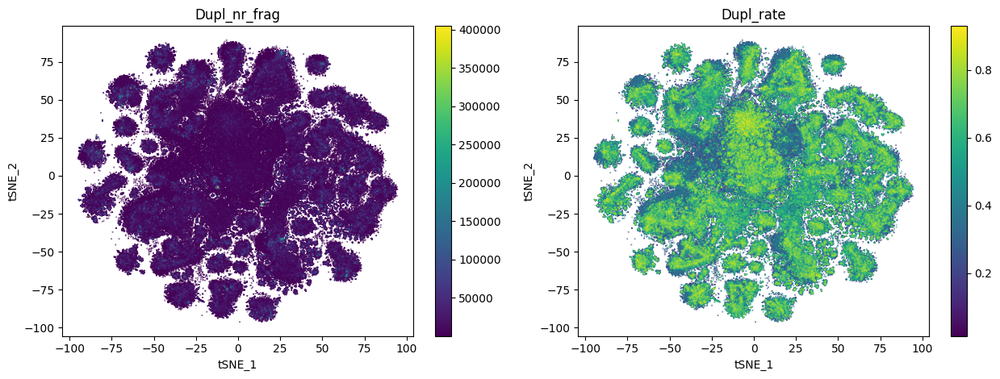

In [21]:
# model 120
plot_metadata(
    cistopic_obj,
    reduction_name='harmony_tech_details_tSNE',
    variables=['Dupl_nr_frag', 'Dupl_rate', ],
    target='cell', num_columns=2,#figsize = (10,10),
    text_size=7,
    #color_dictionary = color_dict,
    dot_size=0.1)

In [22]:
coord = cistopic_obj.projections["cell"]["harmony_tech_details_tSNE"]

In [23]:
colors = [colors_embryo_figure[v] for v in cistopic_obj.cell_data['final_embryo_annot_atlas_05112024']]

In [24]:
index = np.arange(coord.shape[0])
random.shuffle(index)

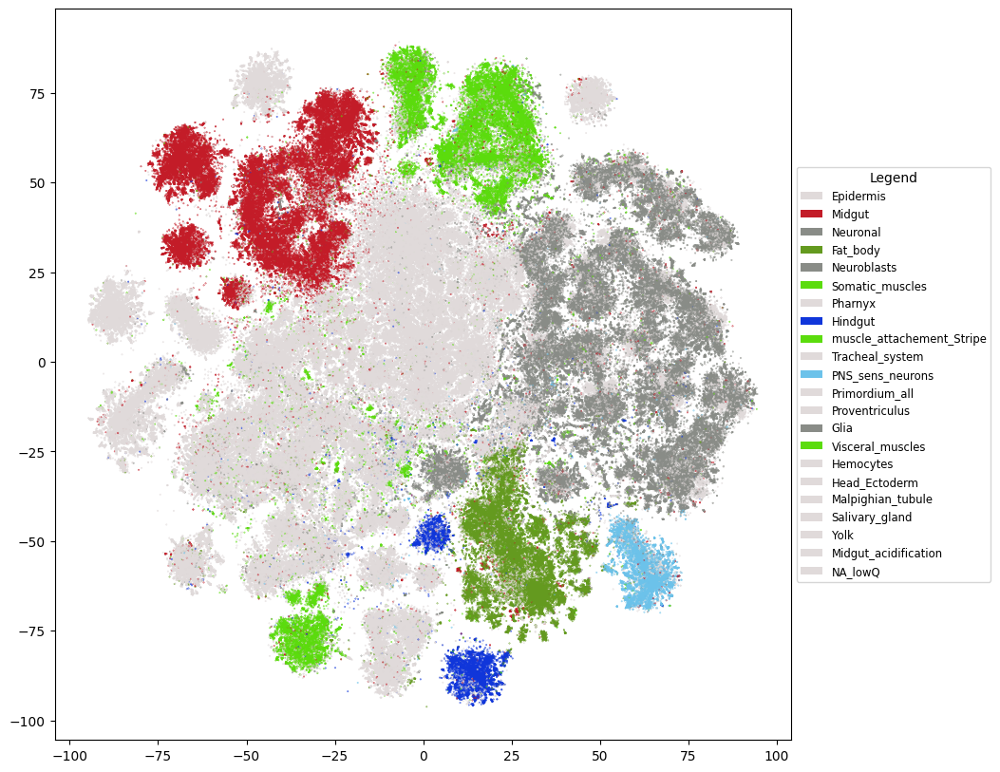

In [25]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, )  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_embryo_figure.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_all_harmony_tech_details_with_shuffling_celltypes_embryo_overview.png", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

### cell types

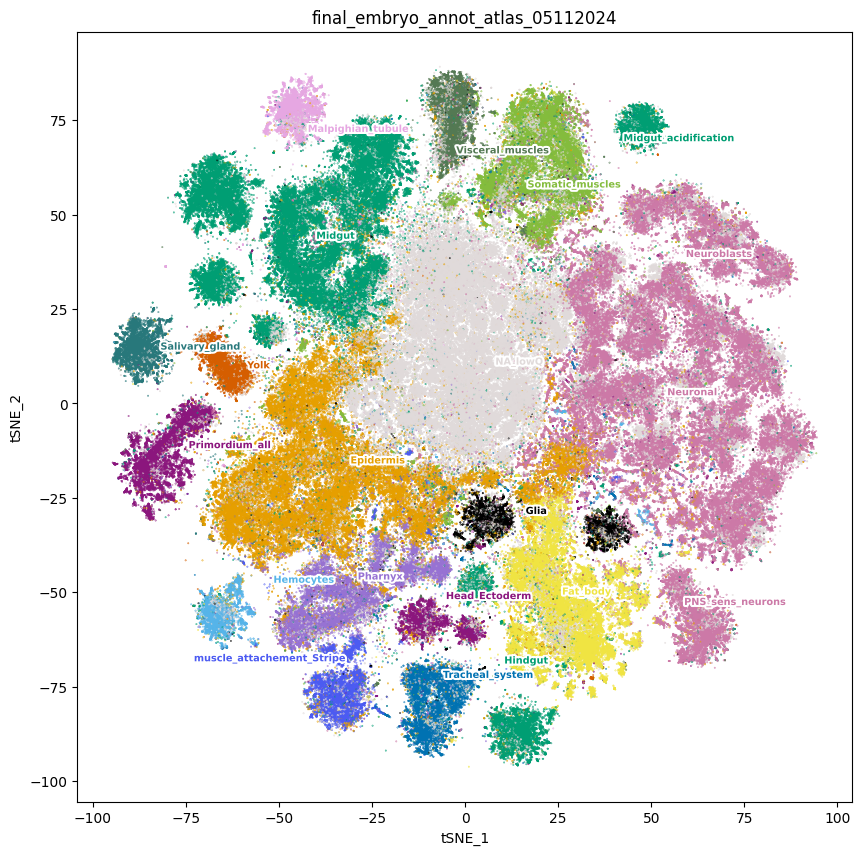

In [8]:
# model 220
plot_metadata(
    cistopic_obj,
    reduction_name='harmony_tech_details_tSNE',
    variables=['final_embryo_annot_atlas_05112024'],
    target='cell', num_columns=1,figsize = (10,10),
    text_size=7,
    color_dictionary = color_dict,
    dot_size=0.1)

In [6]:
coord = cistopic_obj.projections["cell"]["harmony_tech_details_tSNE"]

In [12]:
colors = [colors_annotations_final_embryo_annot_atlas_05112024[v] for v in cistopic_obj.cell_data['final_embryo_annot_atlas_05112024']]

In [13]:
index = np.arange(coord.shape[0])
random.shuffle(index)

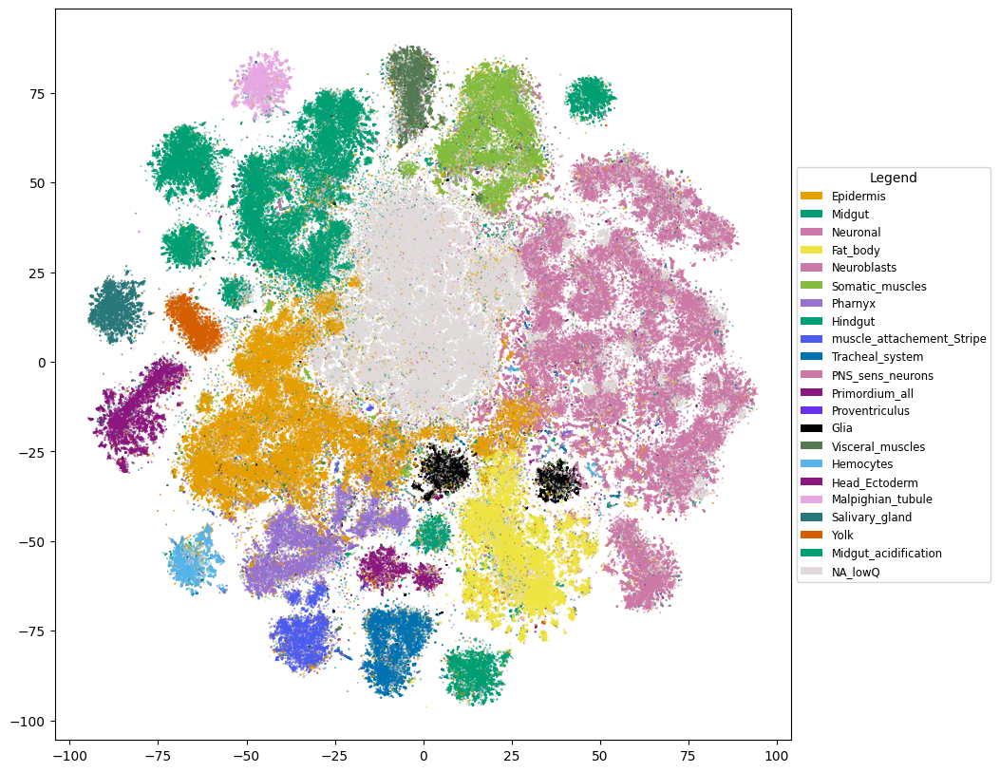

In [14]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, rasterized=True)  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_annotations_final_embryo_annot_atlas_05112024.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_all_harmony_tech_details_with_shuffling_celltypes.pdf", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

### tech

In [60]:
coord = cistopic_obj.projections["cell"]["harmony_tech_details_tSNE"]

In [61]:
colors = [colors_tech[v] for v in cistopic_obj.cell_data['tech']]

In [62]:
index = np.arange(coord.shape[0])
random.shuffle(index)

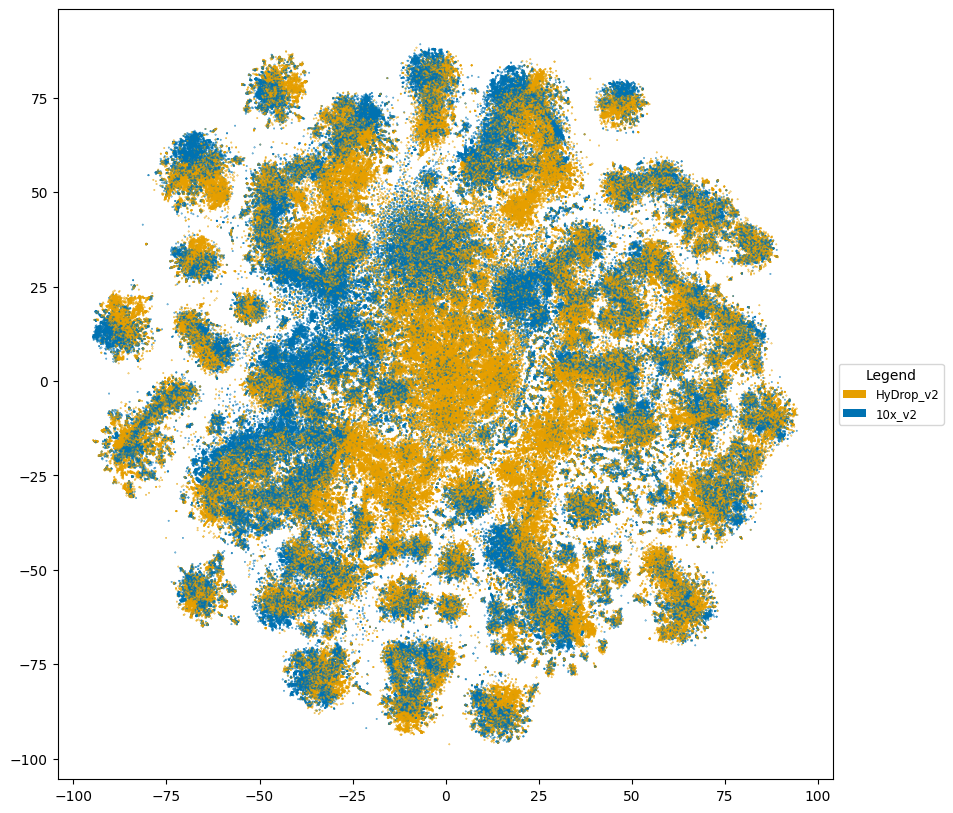

In [63]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, rasterized=True)  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_tech.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_all_harmony_tech_details_with_shuffling_tech.pdf", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

In [39]:
cistopic_obj.cell_data

,cisTopic_log_nr_frag,cisTopic_nr_frag,cisTopic_log_nr_acc,cisTopic_nr_acc,Log_total_nr_frag,Log_unique_nr_frag,Total_nr_frag,Unique_nr_frag,Dupl_nr_frag,Dupl_rate,...,annotations_big_embryo_atlas_12082024,annotations_big_embryo_atlas_13082024,annotations_big_embryo_atlas_15082024,tech_details,annotations_big_embryo_atlas_15082024_broad,tech,dechor,annotations_big_embryo_atlas_09092024_broad,annotations_big_embryo_atlas_09092024,final_embryo_annot_atlas_05112024
CTCGATATCTGCTCGTTCATGATCTAGGTA___FDM__0a2768__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X3,3.084219,1214,3.057286,1141,3.669131,3.229682,4668,1697,2971,0.636461,...,Neural_3,NB_midline_cells_NA,NB_midline_cells_Genital_endocrine_cells,HyDrop_v2_dechor,NBs,HyDrop_v2,dechor,VNC,VNC,Neuronal
CTACGCTGATCTGATTATGTTAATCGCACA___FDM__0a2768__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X3,3.052309,1128,3.024075,1057,3.681060,3.237041,4798,1726,3072,0.640267,...,VNC_2,VNC_1,neuronal_ttk_olf_neuron_sepcification_dendrite...,HyDrop_v2_dechor,Neuronal_brain,HyDrop_v2,dechor,Neuronal_brain,neuronal_ttk,Neuronal
GTTACCGCTCGGACCAAGTGTGGCTTAACA___FDM__0a2768__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X3,2.974972,944,2.959995,912,3.501059,3.199206,3170,1582,1588,0.500946,...,NaN,NaN,Tracheal_system,HyDrop_v2_dechor,Tracheal_system,HyDrop_v2,dechor,Tracheal_system,Tracheal_system,Tracheal_system
GAAGCCTAGTCCGTACCTATCCTGCCTATT___FDM__0a2768__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X3,3.611829,4091,3.545555,3512,4.152319,3.774590,14201,5951,8250,0.580945,...,Proventriculus_2,Proventriculus_2_mesh,Proventriculus_mesh,HyDrop_v2_dechor,Proventriculus,HyDrop_v2,dechor,Proventriculus,Proventriculus_mesh,Midgut
AGCATGGAACTTCGCTATGTACCTGAGATG___FDM__0a2768__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X3,4.269746,18610,4.18523,15319,4.766866,4.478884,58461,30122,28339,0.484751,...,NaN,NaN,NaN,HyDrop_v2_dechor,NaN,HyDrop_v2,dechor,NA_1,NA_Genital_endocrine_cells,NA_lowQ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTTGTGACAGTGCGGTGTAACTTGCTACA___FDM__01cd58__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X4,2.593286,392,2.563481,366,3.161368,2.873321,1450,747,703,0.484828,...,NaN,NaN,NaN,HyDrop_v2_dechor,NaN,HyDrop_v2,dechor,NA_1,NA_Genital_endocrine_cells,NA_lowQ
TCTTGGAATGCTGATTATGTGGACTATACT___FDM__01cd58__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X4,2.741152,551,2.732394,540,3.111599,2.914872,1293,822,471,0.364269,...,Fat_body,Fat_body,Epithelial_cells_cuticle_Lcp2_3_Awh,HyDrop_v2_dechor,Epidermis,HyDrop_v2,dechor,Epidermis,Epithelial_cells_cuticle_Lcp2_3_Awh,Epidermis
ACGGTGCTTGTCGCCTAAGTTCTGGAAGCC___FDM__01cd58__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X4,2.764176,581,2.744293,555,3.089552,2.879096,1229,757,472,0.384052,...,Midgut_late_trypsin_2,Digestive_system_midgut_alpha_betaTry_MalA1_A6,Digestive_system_midgut_alpha_betaTry_MalA1_A6,HyDrop_v2_dechor,Midgut,HyDrop_v2,dechor,Midgut,Digestive_system_midgut_alpha_betaTry_MalA1_A6,Midgut
TCAACGTCACCACCGTTCTTTCGGAGTGAC___FDM__01cd58__240229_HyDropATAC_Dros_DGRP_Embryo_16_20AEL_Dechor_sample_X4,2.698101,499,2.68842,488,3.078819,2.877947,1199,755,444,0.370309,...,Glia_1,Glia_main,segmentation_mesoderm_dev_cells_twi,HyDrop_v2_dechor,Amnioserosa,HyDrop_v2,dechor,Glia,Glia_main,Glia


In [40]:
import pandas as pd
cistopic_obj.cell_data['HyDrop_v2'] = cistopic_obj.cell_data['tech'].apply(lambda x: 'yes' if x == 'HyDrop_v2' else pd.NA)

In [41]:
cistopic_obj.cell_data['10x_v2'] = cistopic_obj.cell_data['tech'].apply(lambda x: 'yes' if x == '10x_v2' else pd.NA)

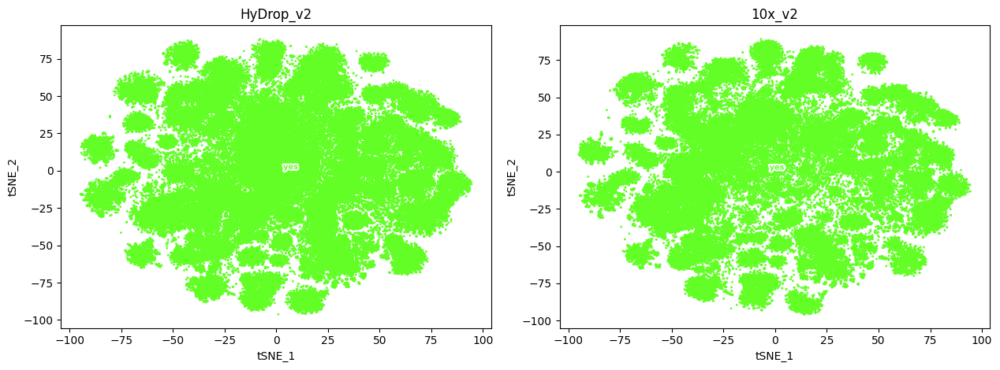

In [42]:
plot_metadata(
    cistopic_obj,
    reduction_name='harmony_tech_details_tSNE',
    variables=['HyDrop_v2','10x_v2'],
    num_columns = 2,
    target='cell', #num_columns=1,figsize = (10,10),
    text_size=7,
    remove_nan = True,
    #color_dictionary = color_dict,
    dot_size=1)

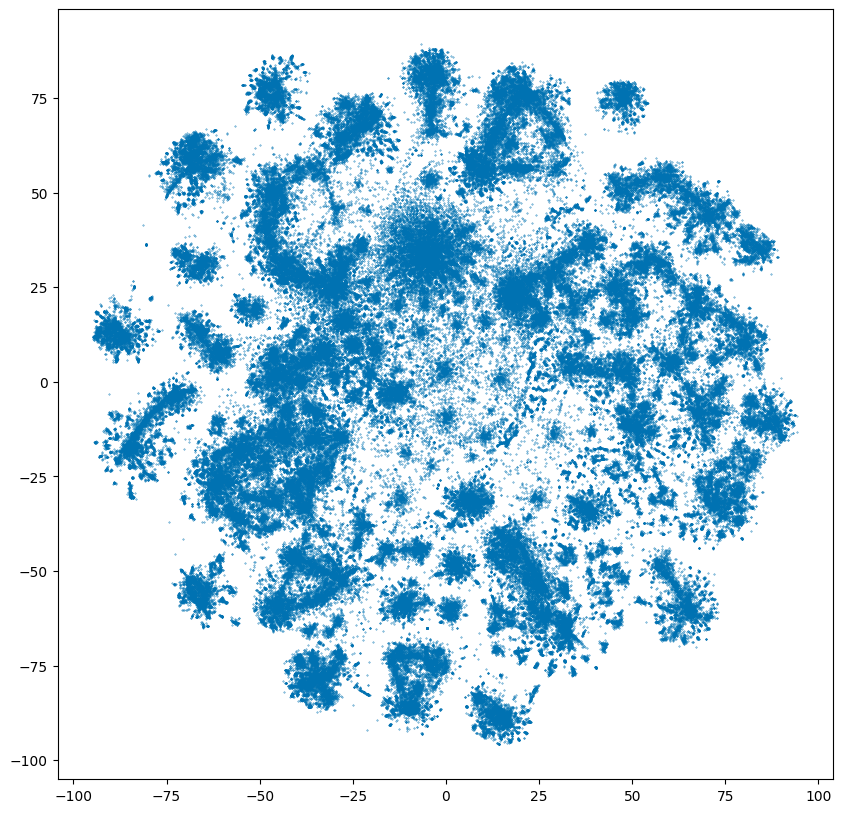

In [43]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Step 1: Assign the tSNE projection to 'coord'
coord = cistopic_obj.projections["cell"]["harmony_tech_details_tSNE"]

# Step 2: Filter the cell data to include only cells where 'tech' is '10x_v2'
filtered_data = cistopic_obj.cell_data[cistopic_obj.cell_data['tech'] == '10x_v2']

# Step 3: Use the filtered data to get the corresponding tSNE coordinates
filtered_indices = filtered_data.index
filtered_coord = coord.loc[filtered_indices]

# Step 4: Create the scatter plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(filtered_coord.iloc[:, 0], filtered_coord.iloc[:, 1], c='#0072B2', s=0.1, alpha=1)  # Plot all dots in the same color

# Optional: Add a legend or skip it if unnecessary
# ax.legend([Patch(facecolor='#E69F00')], ['10x_v2 Samples'], title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')

# Save the plot
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_all_harmony_tech_details_10x_v2.png", dpi=500, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()


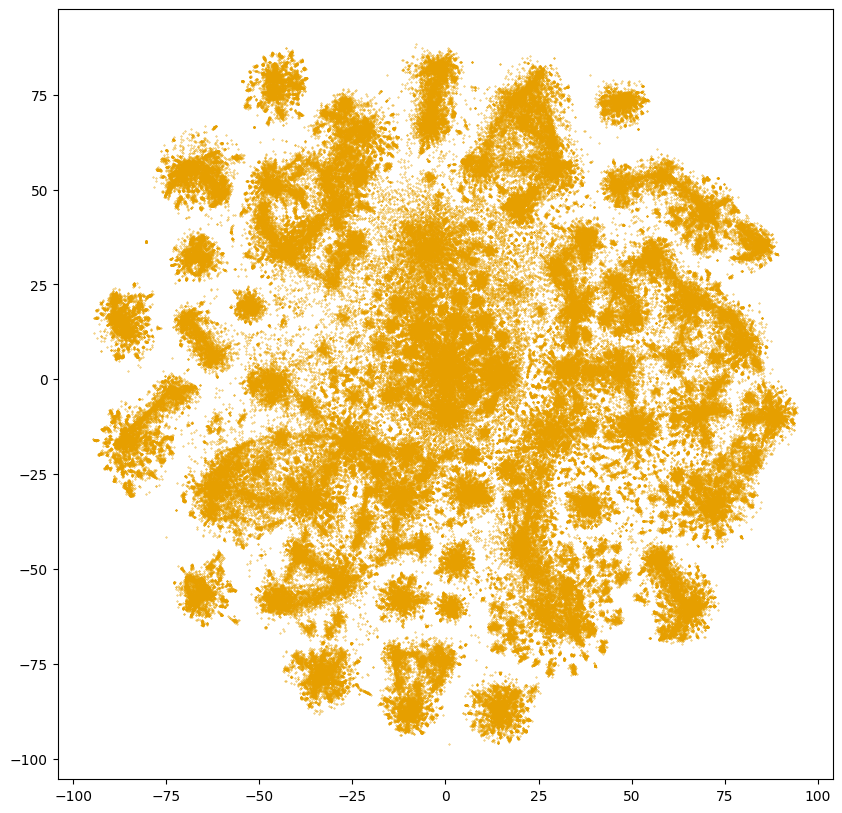

In [44]:
# Step 1: Assign the tSNE projection to 'coord'
coord = cistopic_obj.projections["cell"]["harmony_tech_details_tSNE"]

# Step 2: Filter the cell data to include only cells where 'tech' is '10x_v2'
filtered_data = cistopic_obj.cell_data[cistopic_obj.cell_data['tech'] == 'HyDrop_v2']

# Step 3: Use the filtered data to get the corresponding tSNE coordinates
filtered_indices = filtered_data.index
filtered_coord = coord.loc[filtered_indices]

# Step 4: Create the scatter plot
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(filtered_coord.iloc[:, 0], filtered_coord.iloc[:, 1], c='#E69F00', s=0.1, alpha=1)  # Plot all dots in the same color

# Optional: Add a legend or skip it if unnecessary
# ax.legend([Patch(facecolor='#E69F00')], ['10x_v2 Samples'], title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')

# Save the plot
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_all_harmony_tech_details_HyDrop_v2.png", dpi=500, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()


In [45]:
coord = cistopic_obj.projections["cell"]["harmony_tech_details_UMAP"]

In [46]:
colors = [colors_embryo_figure[v] for v in cistopic_obj.cell_data['final_embryo_annot_atlas_05112024']]

In [47]:
index = np.arange(coord.shape[0])
random.shuffle(index)

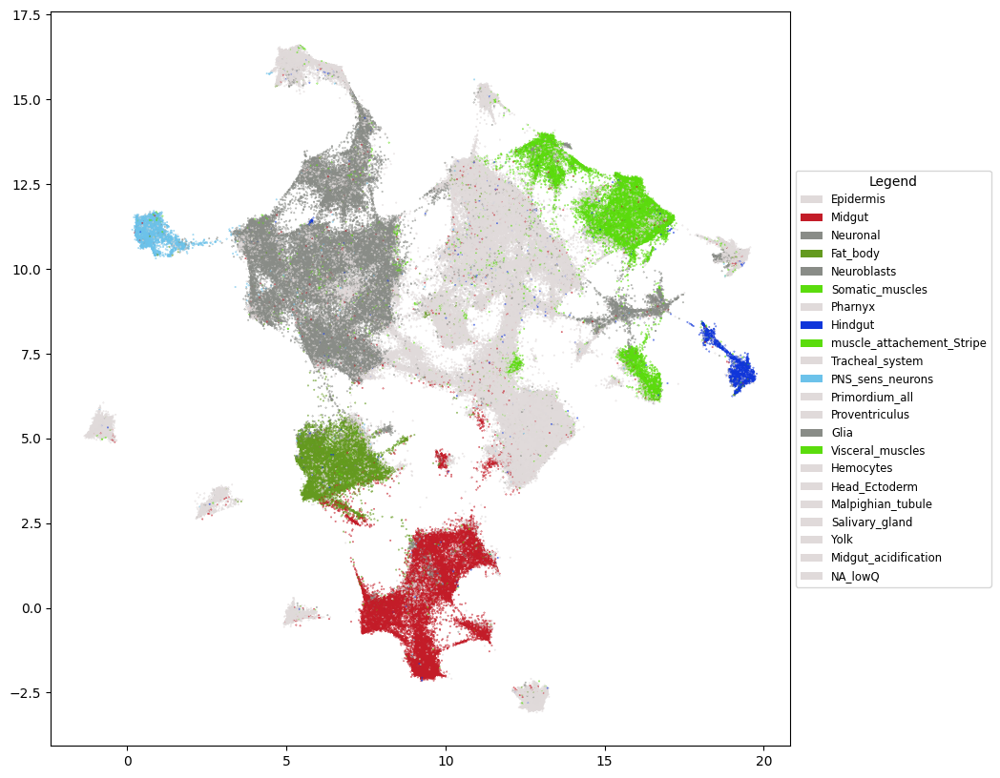

In [48]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, )  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_embryo_figure.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/UMAP_all_harmony_tech_details_with_shuffling_celltypes_embryo_overview.png", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

In [49]:
colors = [colors_annotations_final_embryo_annot_atlas_05112024[v] for v in cistopic_obj.cell_data['final_embryo_annot_atlas_05112024']]

In [8]:
index = np.arange(coord.shape[0])
random.shuffle(index)

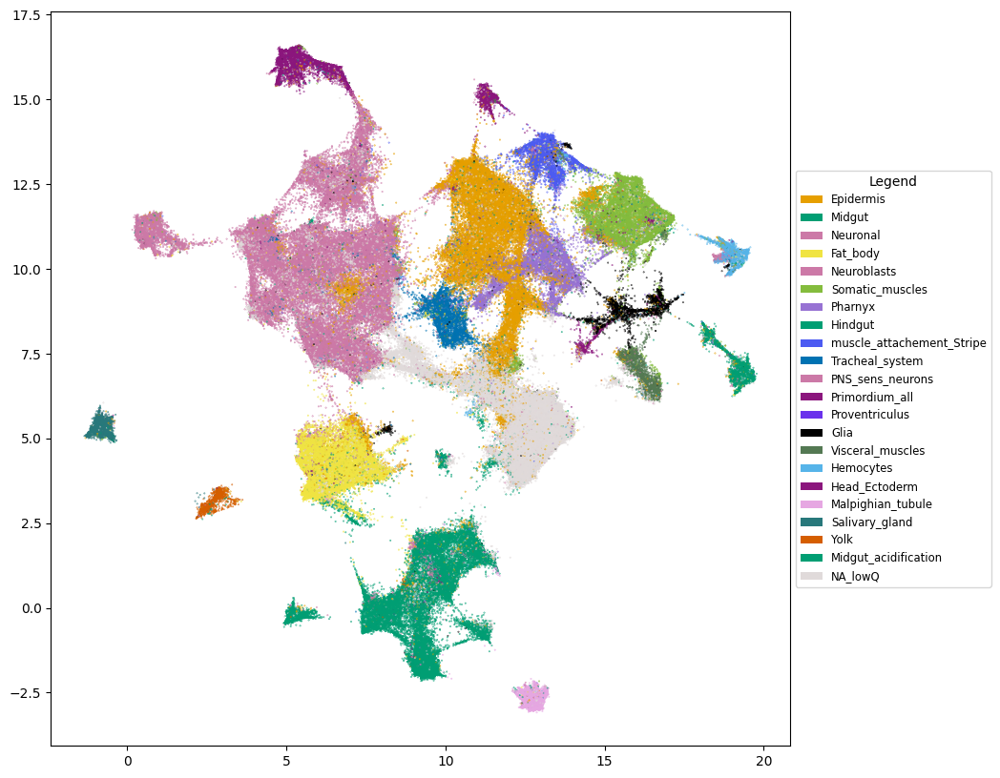

In [50]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, )  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_annotations_final_embryo_annot_atlas_05112024.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/UMAP_all_harmony_tech_details_with_shuffling_celltypes.png", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

In [51]:
coord = cistopic_obj.projections["cell"]["harmony_tech_details_UMAP"]

In [52]:
colors = [colors_tech[v] for v in cistopic_obj.cell_data['tech']]

In [53]:
index = np.arange(coord.shape[0])
random.shuffle(index)

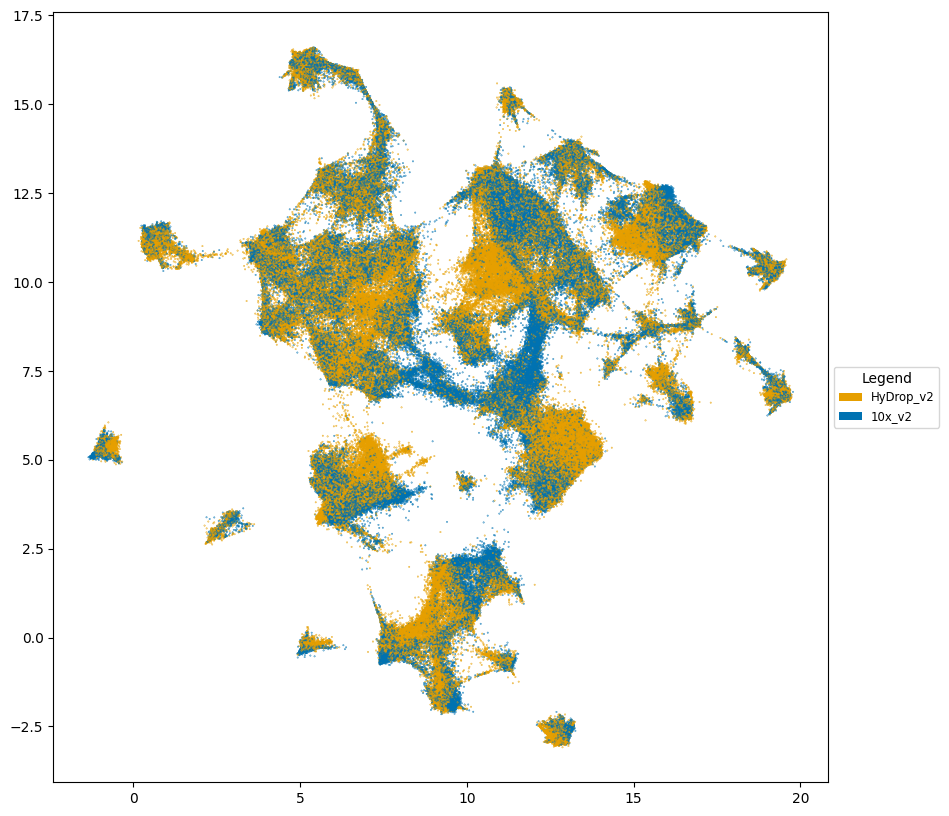

In [54]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, )  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in colors_tech.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/UMAP_all_harmony_tech_details_with_shuffling_tech.png", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

# DARs

In [ ]:
/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/dechor_HyDrop_10x_otsu_notdownsampled

In [17]:
import pickle
infile = open('/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/HyDrop_10x_otsu_notdownsampled/DARs/DARs_HyDrop_v2_x_final_embryo_annot_atlas.pkl', 'rb')
markers_dict_HyDrop_v2 = pickle.load(infile)
infile.close()

In [18]:
import pickle
infile = open('/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/HyDrop_10x_otsu_notdownsampled/DARs/DARs_10x_x_final_embryo_annot_atlas.pkl', 'rb')
markers_dict_10x_v2 = pickle.load(infile)
infile.close()

In [19]:
# Get the keys from both dictionaries
keys_HyDrop_v2 = set(markers_dict_HyDrop_v2.keys())
keys_10x_v2 = set(markers_dict_10x_v2.keys())

# Find the overlap between the two sets of keys
overlapping_keys = keys_HyDrop_v2.intersection(keys_10x_v2)

# Find the keys unique to each dictionary
unique_to_HyDrop_v2 = keys_HyDrop_v2 - keys_10x_v2
unique_to_10x_v2 = keys_10x_v2 - keys_HyDrop_v2

# Print the results
print("Overlapping keys:")
print(overlapping_keys)

print("\nKeys unique to HyDrop_v2:")
print(unique_to_HyDrop_v2)

print("\nKeys unique to 10x_v2:")
print(unique_to_10x_v2)

Overlapping keys:
{'Neuronal', 'Glia', 'NA_lowQ', 'Midgut', 'Head_Ectoderm', 'Midgut_acidification', 'PNS_sens_neurons', 'Tracheal_system', 'Fat_body', 'Pharnyx', 'Epidermis', 'Primordium_all', 'Visceral_muscles', 'Salivary_gland', 'Hemocytes', 'Neuroblasts', 'Yolk', 'muscle_attachement_Stripe', 'Somatic_muscles', 'Malpighian_tubule', 'Hindgut'}

Keys unique to HyDrop_v2:
set()

Keys unique to 10x_v2:
set()


In [20]:
# Get the keys from both dictionaries
keys_HyDrop_v2 = set(markers_dict_HyDrop_v2.keys())
keys_10x_v2 = set(markers_dict_10x_v2.keys())

# Find the overlap between the two sets of keys
overlapping_keys = keys_HyDrop_v2.intersection(keys_10x_v2)

# Find the keys unique to each dictionary
unique_to_HyDrop_v2 = keys_HyDrop_v2 - keys_10x_v2
unique_to_10x_v2 = keys_10x_v2 - keys_HyDrop_v2

# Print the results
print("Overlapping keys:")
print(overlapping_keys)

print("\nKeys unique to HyDrop_v2:")
print(unique_to_HyDrop_v2)

print("\nKeys unique to 10x_v2:")
print(unique_to_10x_v2)

Overlapping keys:
{'Neuronal', 'Glia', 'NA_lowQ', 'Midgut', 'Head_Ectoderm', 'Midgut_acidification', 'PNS_sens_neurons', 'Tracheal_system', 'Fat_body', 'Pharnyx', 'Epidermis', 'Primordium_all', 'Visceral_muscles', 'Salivary_gland', 'Hemocytes', 'Neuroblasts', 'Yolk', 'muscle_attachement_Stripe', 'Somatic_muscles', 'Malpighian_tubule', 'Hindgut'}

Keys unique to HyDrop_v2:
set()

Keys unique to 10x_v2:
set()


In [21]:
if 'NA_lowQ' in markers_dict_HyDrop_v2:
    del markers_dict_HyDrop_v2['NA_lowQ']

In [22]:
if 'NA_lowQ' in markers_dict_10x_v2:
    del markers_dict_10x_v2['NA_lowQ']

In [23]:
# filter top 1000 DARs
def filter_top_log2fc(markers_dict, top_n=1000):
    filtered_dict = {}
    for marker, df in markers_dict.items():
        df_sorted = df.sort_values(by='Log2FC', ascending=False).head(top_n)
        filtered_dict[marker] = df_sorted
    return filtered_dict

In [24]:
markers_dict_HyDrop_filtered = filter_top_log2fc(markers_dict_HyDrop_v2)
markers_dict_10x_filtered = filter_top_log2fc(markers_dict_10x_v2)

print overlap of top 1000 DARs

In [25]:
overlap_df = pd.DataFrame(index=markers_dict_HyDrop_filtered.keys(), columns=markers_dict_10x_filtered.keys(), data=0)

In [26]:
for marker_HyDrop, df_HyDrop in markers_dict_HyDrop_filtered.items():
    regions_HyDrop = set(df_HyDrop.index)
    for marker_10x, df_10x in markers_dict_10x_filtered.items():
        regions_10x = set(df_10x.index)
        overlap_count = len(regions_HyDrop & regions_10x)
        overlap_df.loc[marker_HyDrop, marker_10x] = overlap_count

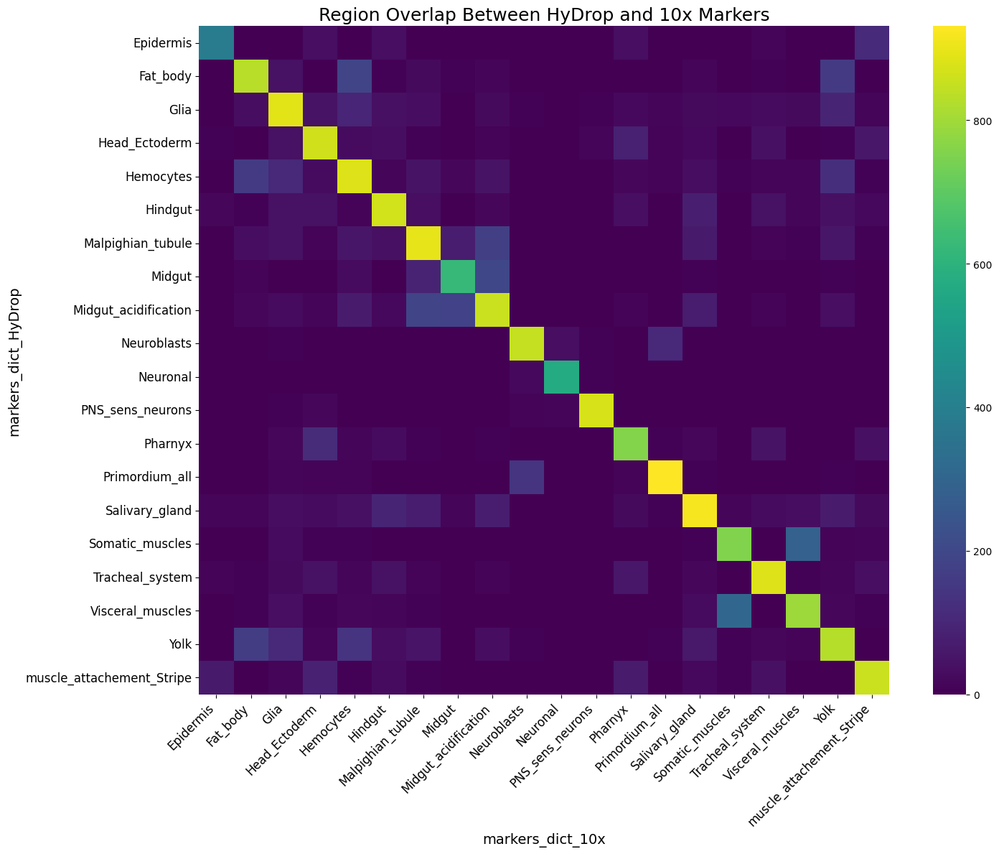

In [27]:
plt.figure(figsize=(15, 12))
sns.heatmap(overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Region Overlap Between HyDrop and 10x Markers', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.show()

print and save percentage overlap of top 1000 DARs

In [28]:
percentage_overlap_df = overlap_df.copy()
for marker_HyDrop in overlap_df.index:
    total_regions_HyDrop = len(markers_dict_HyDrop_filtered[marker_HyDrop])
    for marker_10x in overlap_df.columns:
        total_regions_10x = len(markers_dict_10x_filtered[marker_10x])
        max_regions = max(total_regions_HyDrop, total_regions_10x)
        if max_regions > 0:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = (overlap_df.loc[marker_HyDrop, marker_10x] / max_regions)
        else:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = 0

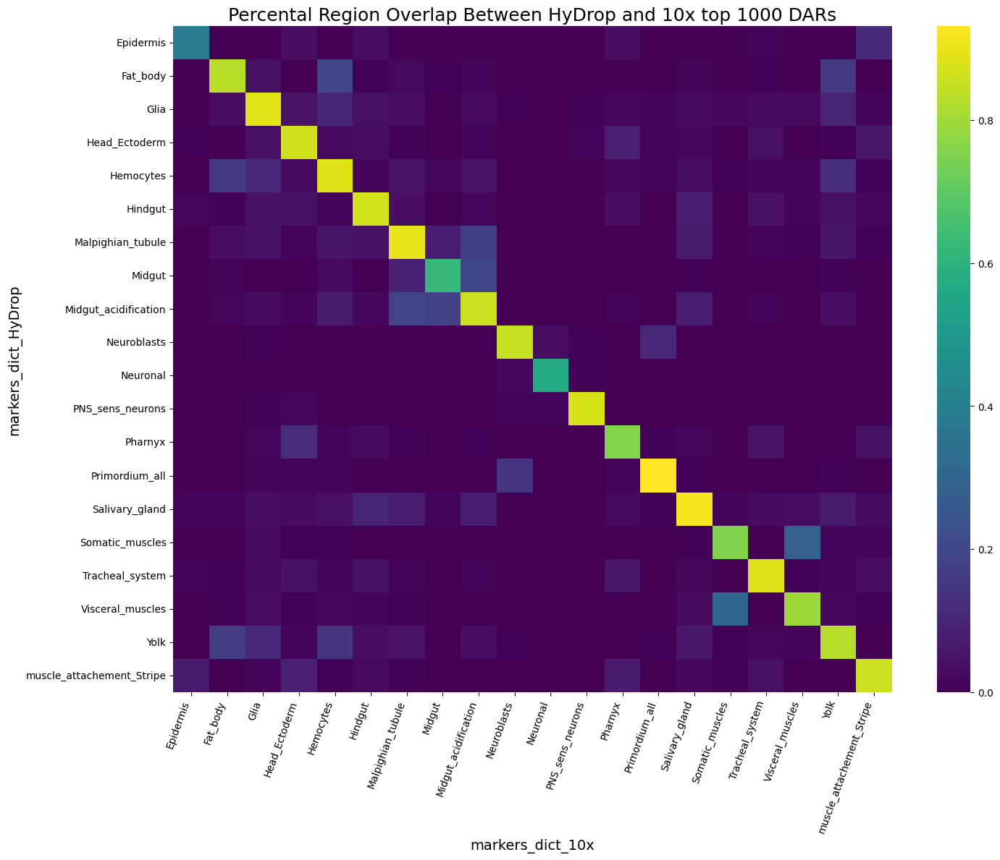

In [29]:
plt.figure(figsize=(15, 12))
sns.heatmap(percentage_overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Percental Region Overlap Between HyDrop and 10x top 1000 DARs', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=70, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/Percent_all_cells_Overlap_top1000_DARs_10x_HyDrop.pdf", dpi=500)  # Save at 300 DPI for good quality
plt.show()

In [31]:
import numpy as np

# Create a dictionary of diagonal overlaps keyed by cell type
diagonal_dict = {cell_type: percentage_overlap_df.loc[cell_type, cell_type]
                 for cell_type in percentage_overlap_df.index}

# Sort the dictionary items by the overlap percentage in increasing order
sorted_diagonal = sorted(diagonal_dict.items(), key=lambda x: x[1])

print("Diagonal overlap percentages:")
for cell_type, overlap in sorted_diagonal:
    print(f"{cell_type}: {overlap * 100:.2f}%")

# Calculate and print the mean overlap (converted to percent)
mean_overlap = np.mean(list(diagonal_dict.values()))
print(f"\nMean diagonal overlap: {mean_overlap * 100:.2f}%")


Diagonal overlap percentages:
Epidermis: 38.30%
Neuronal: 56.90%
Midgut: 62.30%
Somatic_muscles: 75.60%
Pharnyx: 76.00%
Visceral_muscles: 79.50%
Yolk: 82.90%
Fat_body: 83.10%
Neuroblasts: 85.00%
Midgut_acidification: 85.60%
muscle_attachement_Stripe: 85.70%
Head_Ectoderm: 86.20%
Hindgut: 86.90%
PNS_sens_neurons: 87.60%
Tracheal_system: 88.10%
Hemocytes: 88.20%
Glia: 88.80%
Malpighian_tubule: 89.70%
Salivary_gland: 91.90%
Primordium_all: 93.10%

Mean diagonal overlap: 80.57%


In [32]:
# filter top 1000 DARs
def filter_top_log2fc(markers_dict, top_n=1000):
    filtered_dict = {}
    for marker, df in markers_dict.items():
        df_sorted = df.sort_values(by='Log2FC', ascending=False).head(top_n)
        filtered_dict[marker] = df_sorted
    return filtered_dict

In [33]:
markers_dict_HyDrop_filtered = filter_top_log2fc(markers_dict_HyDrop_v2)
markers_dict_10x_filtered = filter_top_log2fc(markers_dict_10x_v2)

print overlap of top 1000 DARs

In [34]:
overlap_df = pd.DataFrame(index=markers_dict_HyDrop_filtered.keys(), columns=markers_dict_10x_filtered.keys(), data=0)

In [35]:
for marker_HyDrop, df_HyDrop in markers_dict_HyDrop_filtered.items():
    regions_HyDrop = set(df_HyDrop.index)
    for marker_10x, df_10x in markers_dict_10x_filtered.items():
        regions_10x = set(df_10x.index)
        overlap_count = len(regions_HyDrop & regions_10x)
        overlap_df.loc[marker_HyDrop, marker_10x] = overlap_count

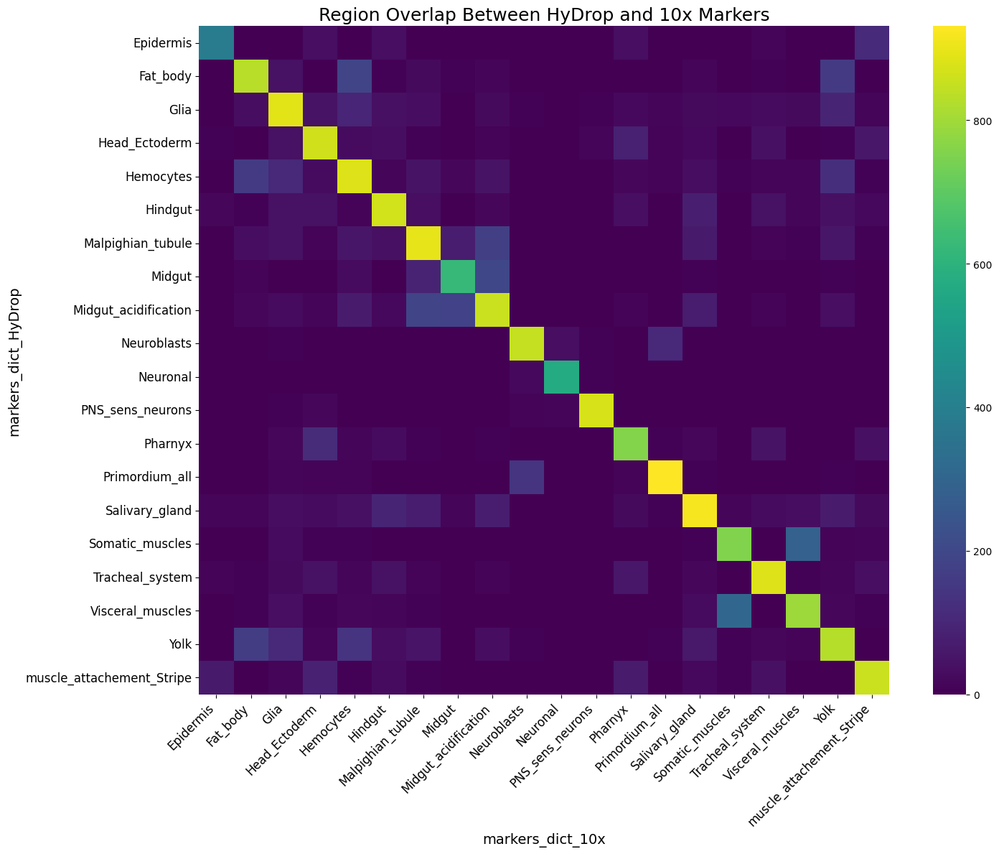

In [36]:
plt.figure(figsize=(15, 12))
sns.heatmap(overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Region Overlap Between HyDrop and 10x Markers', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.show()

print and save percentage overlap of top 1000 DARs

In [37]:
percentage_overlap_df = overlap_df.copy()
for marker_HyDrop in overlap_df.index:
    total_regions_HyDrop = len(markers_dict_HyDrop_filtered[marker_HyDrop])
    for marker_10x in overlap_df.columns:
        total_regions_10x = len(markers_dict_10x_filtered[marker_10x])
        max_regions = max(total_regions_HyDrop, total_regions_10x)
        if max_regions > 0:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = (overlap_df.loc[marker_HyDrop, marker_10x] / max_regions)
        else:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = 0

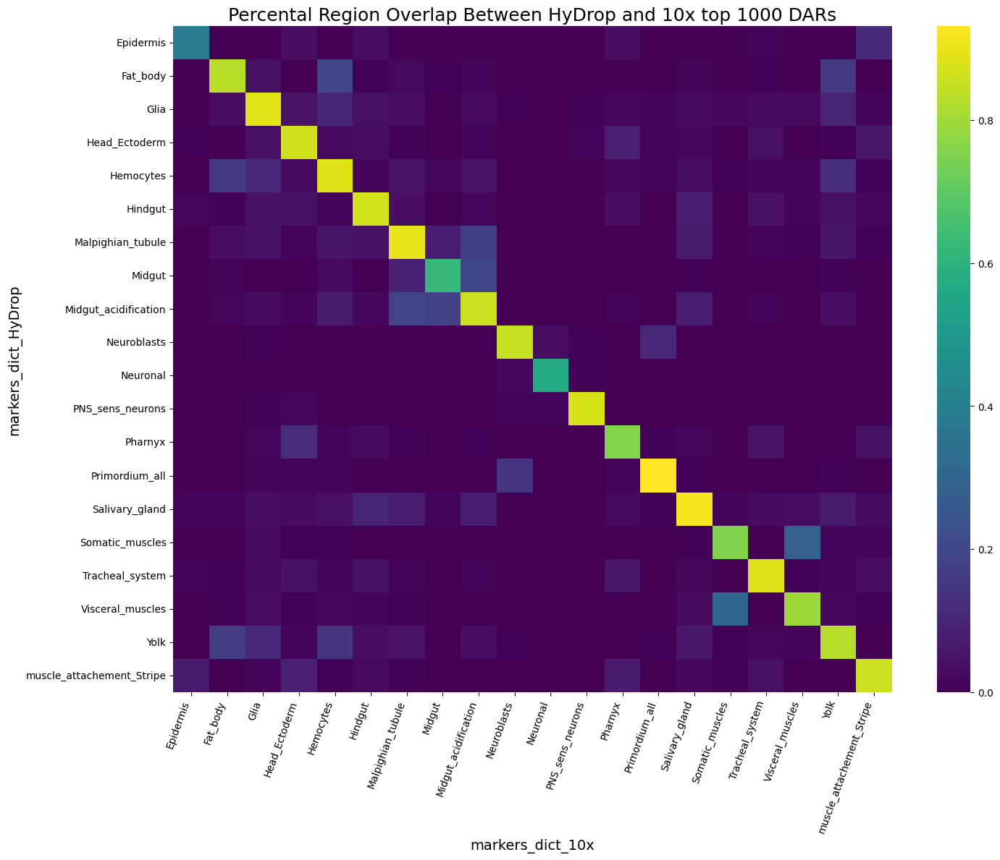

In [38]:
plt.figure(figsize=(15, 12))
sns.heatmap(percentage_overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Percental Region Overlap Between HyDrop and 10x top 1000 DARs', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=70, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/Percent_all_cells_Overlap_top1000_DARs_10x_HyDrop.pdf", dpi=500)  # Save at 300 DPI for good quality
plt.show()

In [39]:
import numpy as np

# Create a dictionary of diagonal overlaps keyed by cell type
diagonal_dict = {cell_type: percentage_overlap_df.loc[cell_type, cell_type]
                 for cell_type in percentage_overlap_df.index}

# Sort the dictionary items by the overlap percentage in increasing order
sorted_diagonal = sorted(diagonal_dict.items(), key=lambda x: x[1])

print("Diagonal overlap percentages:")
for cell_type, overlap in sorted_diagonal:
    print(f"{cell_type}: {overlap * 100:.2f}%")

# Calculate and print the mean overlap (converted to percent)
mean_overlap = np.mean(list(diagonal_dict.values()))
print(f"\nMean diagonal overlap: {mean_overlap * 100:.2f}%")


Diagonal overlap percentages:
Epidermis: 38.30%
Neuronal: 56.90%
Midgut: 62.30%
Somatic_muscles: 75.60%
Pharnyx: 76.00%
Visceral_muscles: 79.50%
Yolk: 82.90%
Fat_body: 83.10%
Neuroblasts: 85.00%
Midgut_acidification: 85.60%
muscle_attachement_Stripe: 85.70%
Head_Ectoderm: 86.20%
Hindgut: 86.90%
PNS_sens_neurons: 87.60%
Tracheal_system: 88.10%
Hemocytes: 88.20%
Glia: 88.80%
Malpighian_tubule: 89.70%
Salivary_gland: 91.90%
Primordium_all: 93.10%

Mean diagonal overlap: 80.57%


In [40]:
# filter top 3000 DARs
def filter_top_log2fc(markers_dict, top_n=3000):
    filtered_dict = {}
    for marker, df in markers_dict.items():
        df_sorted = df.sort_values(by='Log2FC', ascending=False).head(top_n)
        filtered_dict[marker] = df_sorted
    return filtered_dict

In [41]:
markers_dict_HyDrop_filtered = filter_top_log2fc(markers_dict_HyDrop_v2)
markers_dict_10x_filtered = filter_top_log2fc(markers_dict_10x_v2)

print overlap of top 1000 DARs

In [42]:
overlap_df = pd.DataFrame(index=markers_dict_HyDrop_filtered.keys(), columns=markers_dict_10x_filtered.keys(), data=0)

In [43]:
for marker_HyDrop, df_HyDrop in markers_dict_HyDrop_filtered.items():
    regions_HyDrop = set(df_HyDrop.index)
    for marker_10x, df_10x in markers_dict_10x_filtered.items():
        regions_10x = set(df_10x.index)
        overlap_count = len(regions_HyDrop & regions_10x)
        overlap_df.loc[marker_HyDrop, marker_10x] = overlap_count

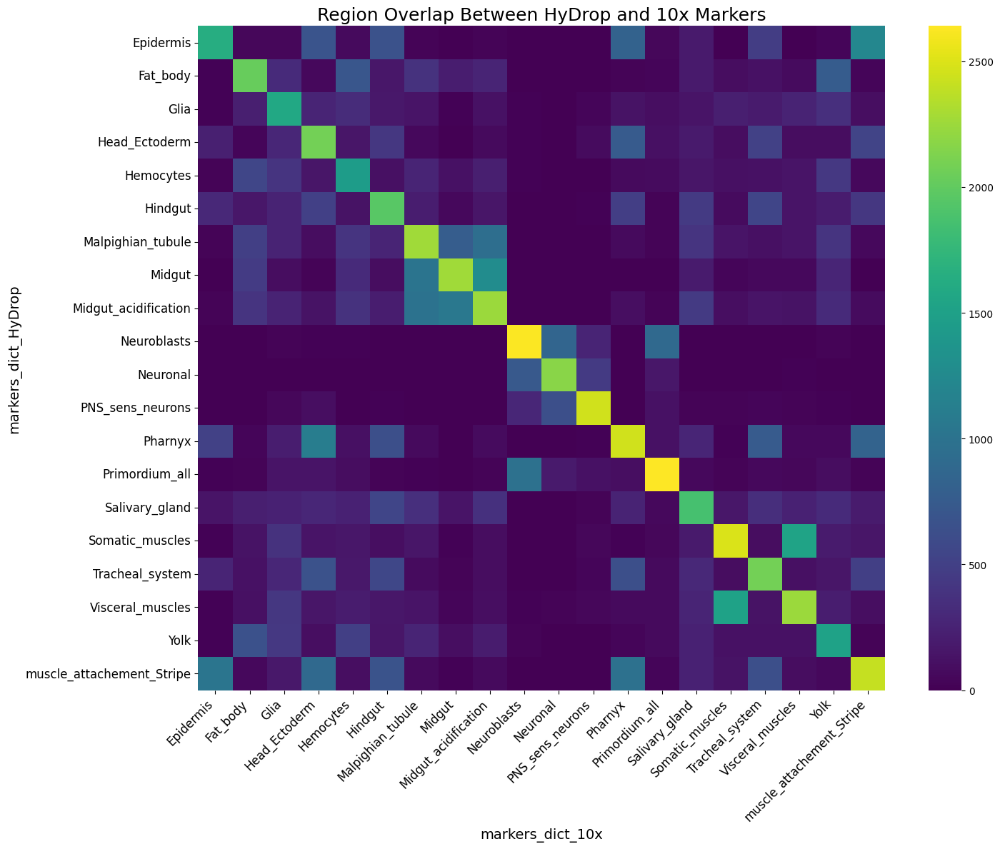

In [44]:
plt.figure(figsize=(15, 12))
sns.heatmap(overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Region Overlap Between HyDrop and 10x Markers', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.show()

print and save percentage overlap of top 3000 DARs

In [45]:
percentage_overlap_df = overlap_df.copy()
for marker_HyDrop in overlap_df.index:
    total_regions_HyDrop = len(markers_dict_HyDrop_filtered[marker_HyDrop])
    for marker_10x in overlap_df.columns:
        total_regions_10x = len(markers_dict_10x_filtered[marker_10x])
        max_regions = max(total_regions_HyDrop, total_regions_10x)
        if max_regions > 0:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = (overlap_df.loc[marker_HyDrop, marker_10x] / max_regions)
        else:
            percentage_overlap_df.loc[marker_HyDrop, marker_10x] = 0

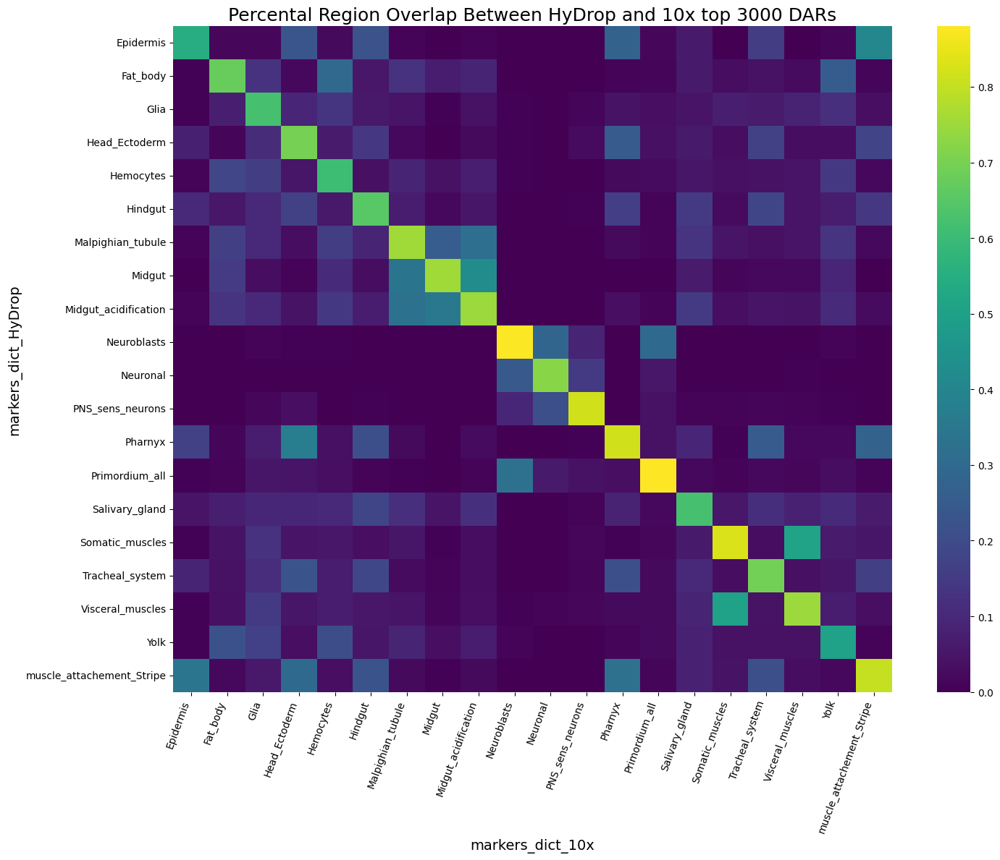

In [46]:
plt.figure(figsize=(15, 12))
sns.heatmap(percentage_overlap_df, annot=False, cmap='viridis', cbar=True)
plt.title('Percental Region Overlap Between HyDrop and 10x top 3000 DARs', fontsize=18)
plt.xlabel('markers_dict_10x', fontsize=14)
plt.ylabel('markers_dict_HyDrop', fontsize=14)
plt.xticks(rotation=70, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/Percent_all_cells_Overlap_top3000_DARs_10x_HyDrop.pdf", dpi=500)  # Save at 300 DPI for good quality
plt.show()

In [47]:
import numpy as np

# Create a dictionary of diagonal overlaps keyed by cell type
diagonal_dict = {cell_type: percentage_overlap_df.loc[cell_type, cell_type]
                 for cell_type in percentage_overlap_df.index}

# Sort the dictionary items by the overlap percentage in increasing order
sorted_diagonal = sorted(diagonal_dict.items(), key=lambda x: x[1])

print("Diagonal overlap percentages:")
for cell_type, overlap in sorted_diagonal:
    print(f"{cell_type}: {overlap * 100:.2f}%")

# Calculate and print the mean overlap (converted to percent)
mean_overlap = np.mean(list(diagonal_dict.values()))
print(f"\nMean diagonal overlap: {mean_overlap * 100:.2f}%")

Diagonal overlap percentages:
Yolk: 50.87%
Epidermis: 54.97%
Hemocytes: 60.31%
Glia: 62.18%
Salivary_gland: 62.20%
Hindgut: 65.23%
Fat_body: 67.47%
Tracheal_system: 69.17%
Head_Ectoderm: 69.70%
Neuronal: 72.30%
Midgut_acidification: 74.73%
Visceral_muscles: 74.93%
Malpighian_tubule: 75.43%
Midgut: 75.57%
muscle_attachement_Stripe: 80.23%
Pharnyx: 81.53%
PNS_sens_neurons: 81.70%
Somatic_muscles: 83.00%
Neuroblasts: 87.43%
Primordium_all: 88.00%

Mean diagonal overlap: 71.85%


# pycistarget - updated

In [71]:
hydrop_dir = "/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/HyDrop_10x_otsu_notdownsampled/pycistarget/HyDrop_final_embryo_annot_atlas_05112024"
tenx_dir = "/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/cistopic_LCB_embryo_consensuspeaks/HyDrop_10x_otsu_notdownsampled/pycistarget/10x_final_embryo_annot_atlas_05112024"

colors = {'Epidermis': '#E69F00', 
             'Midgut': '#009E73', 
             'Neuronal': '#CC79A7', 
             'Fat_body': '#F0E442', 
             'Neuroblasts': '#CC79A7', 
             'Somatic_muscles': '#84BC3D', 
             #'Neuronal_brain': '#CC79A7', 
             #'Neuronal_brain_visual_system_dev': '#CC79A7', 
             'Pharnyx': '#9772D3', 
             'Hindgut': '#009E73', 
             'muscle_attachement_Stripe': '#4C5BF2', 
             'Tracheal_system': '#0072B2', 
             'PNS_sens_neurons': '#CC79A7', 
             'Primordium_all': '#8B167D', 
             'Proventriculus': '#6A31EC', 
             'Glia': '#000000', 
             'Visceral_muscles': '#547953', 
             'Hemocytes': '#56B4E9', 
             'Head_Ectoderm': '#8B167D', 
             'Malpighian_tubule': '#E6A7E2',
             #'Endocrine_cells': '#28787B', 
             'Salivary_gland': '#28787B', 
            # 'Imaginal_disc_development': '#CEA427', 
             'Yolk': '#D55E00', 
             #'Midgut_primordial_cells': '#4C5BF2', 
             'Midgut_acidification': '#009E73', 
            # 'Amnioserosa': '#8B167D', 
            # 'Genital_disc': '#70DEC5', 
             'NA_lowQ': '#E0DADA'}

In [72]:
def extract_nes_scores(directory):
    nes_scores = {}
    for filename in os.listdir(directory):
        if filename.endswith(".tsv"):
            # Read the TSV file
            df = pd.read_csv(os.path.join(directory, filename), sep='\t', index_col=0)
            for _, row in df.iterrows():
                motif = row.name  # Motif information is in the index
                region_set = row['Region_set']  # Cell type information in the 'Region_set' column
                nes = row['NES']  # NES score

                if region_set not in nes_scores:
                    nes_scores[region_set] = {}
                nes_scores[region_set][motif] = nes
    return nes_scores


In [73]:
nes_scores_hydrop = extract_nes_scores(hydrop_dir)
nes_scores_10x = extract_nes_scores(tenx_dir)

In [74]:
nes_scores_10x

{'muscle_attachement_Stripe': {'metacluster_132.4': 8.794787514926941,
  'flyfactorsurvey__Mes2_SANGER_5_FBgn0037207': 4.902132325937744,
  'transfac_pro__M07300': 4.77353341510828,
  'taipale_tf_pairs__GCM2_PITX1_RTRCGGGSGATTAN_CAP_repr': 4.342050227456794,
  'metacluster_32.3': 3.9461009493766057,
  'metacluster_174.6': 3.649985036282448,
  'metacluster_130.15': 3.634756217894748,
  'taipale_tf_pairs__GCM2_ONECUT2_RTRCGGGNNNNNNATCRATN_CAP_repr': 3.457086670038254,
  'flyfactorsurvey__sqz_SANGER_5_FBgn0010768': 3.254881803668244,
  'metacluster_32.4': 3.2295004396887443,
  'metacluster_140.5': 3.2227320759608777,
  'transfac_pro__M03554': 3.2168097576989947,
  'flyfactorsurvey__cic_SANGER_5_FBgn0028386': 3.202426984777278,
  'transfac_pro__M02006': 3.124590801906814,
  'nitta__CG18619_TCGAAG20NGA_KH_RTGACGTCAT_m1_c3u': 3.110208028985098,
  'hdpi__MYF6': 3.0899029378014986},
 'Fat_body': {'flyfactorsurvey__GATAd_SANGER_5_FBgn0032223': 13.597100778680144,
  'transfac_public__M00487': 13

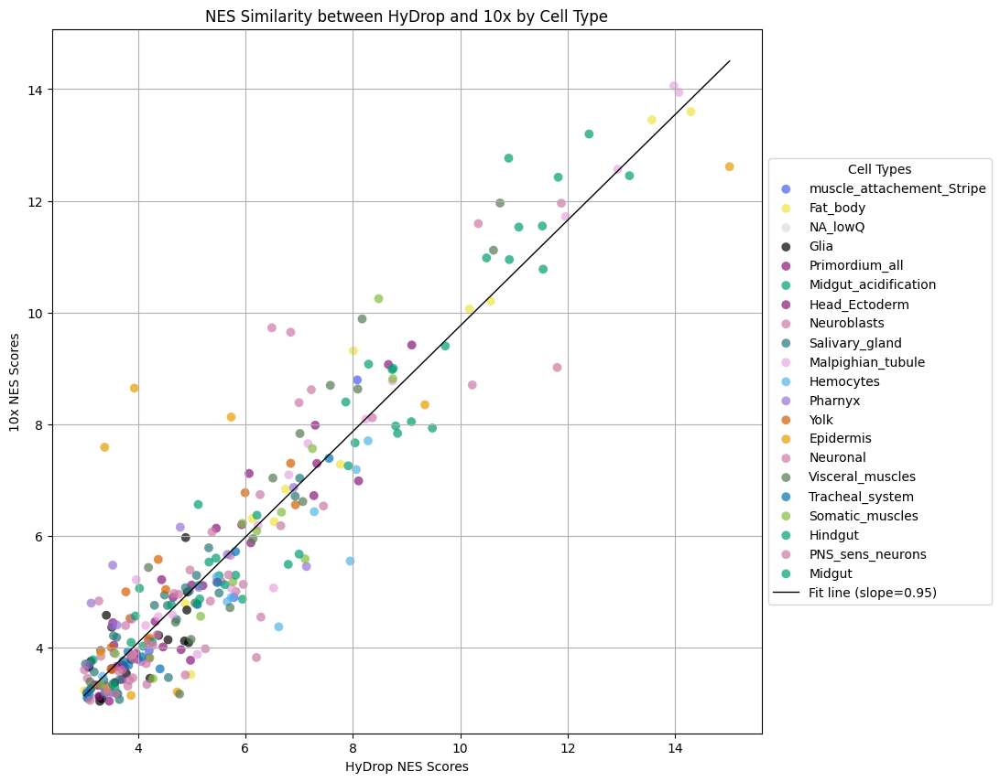

In [75]:
plt.figure(figsize=(10, 10))

all_x_vals = []
all_y_vals = []

for cell_type in nes_scores_hydrop:
    if cell_type in nes_scores_10x:
        x_vals = []
        y_vals = []
        for motif in nes_scores_hydrop[cell_type]:
            if motif in nes_scores_10x[cell_type]:
                x_vals.append(nes_scores_hydrop[cell_type][motif])
                y_vals.append(nes_scores_10x[cell_type][motif])

        all_x_vals.extend(x_vals)
        all_y_vals.extend(y_vals)

        plt.scatter(x_vals, y_vals, label=cell_type, color=colors.get(cell_type, '#333333'), alpha=0.7, s=50, marker='o', edgecolors='none')


# Calculate the linear fit
slope, intercept = np.polyfit(all_x_vals, all_y_vals, 1)
x_fit = np.array([min(all_x_vals), max(all_x_vals)])
y_fit = slope * x_fit + intercept

# Plot the linear fit line
plt.plot(x_fit, y_fit, color='black', linestyle='-', linewidth=1, label=f'Fit line (slope={slope:.2f})')

plt.xlabel('HyDrop NES Scores')
plt.ylabel('10x NES Scores')
plt.title('NES Similarity between HyDrop and 10x by Cell Type')
plt.legend(title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='medium', title_fontsize='medium')
plt.grid(True)
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_correlation_per_celltype_top1000_DARs_10x_HyDrop.pdf", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()

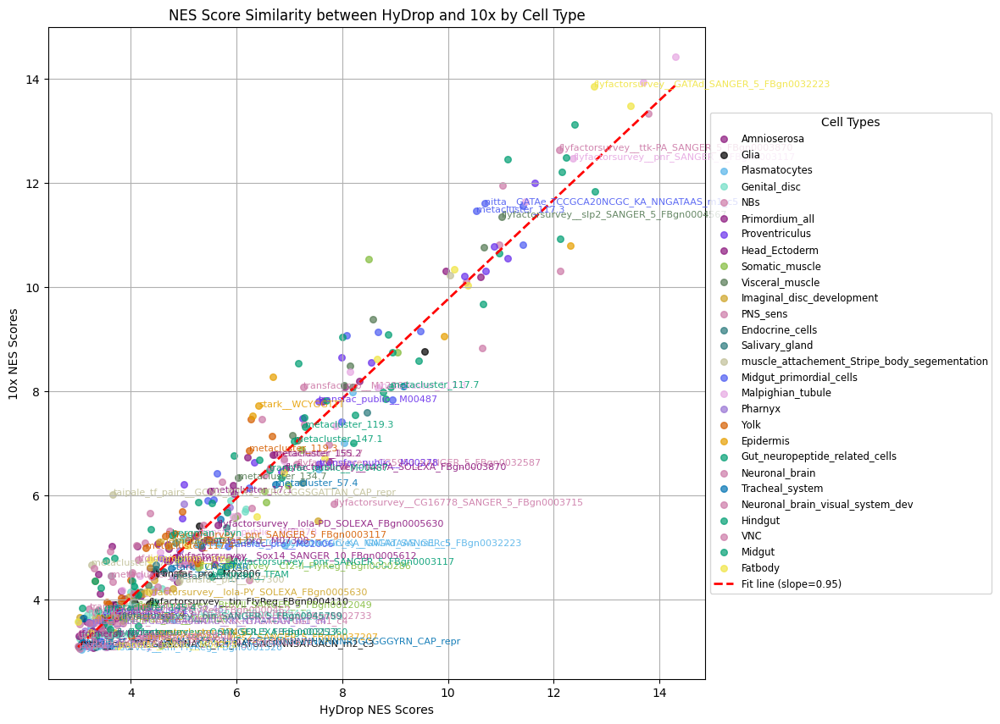

In [8]:
# Match NES scores and plot
plt.figure(figsize=(10, 10))

all_x_vals = []
all_y_vals = []
annotated_motifs = {}

for cell_type in nes_scores_hydrop:
    if cell_type in nes_scores_10x:
        x_vals = []
        y_vals = []
        motifs = []
        for motif in nes_scores_hydrop[cell_type]:
            if motif in nes_scores_10x[cell_type]:
                x_vals.append(nes_scores_hydrop[cell_type][motif])
                y_vals.append(nes_scores_10x[cell_type][motif])
                motifs.append(motif)

        all_x_vals.extend(x_vals)
        all_y_vals.extend(y_vals)

        plt.scatter(x_vals, y_vals, label=cell_type, color=colors.get(cell_type, '#333333'), alpha=0.7, s=30)

        # Annotate three randomly selected motifs for each cell type
        if len(motifs) > 0:
            selected_motifs = random.sample(list(zip(x_vals, y_vals, motifs)), min(3, len(motifs)))
            annotated_motifs[cell_type] = selected_motifs
            for x, y, motif in selected_motifs:
                plt.text(x, y, motif, fontsize=8, color=colors.get(cell_type, '#333333'), alpha=0.9)

# Calculate the linear fit
slope, intercept = np.polyfit(all_x_vals, all_y_vals, 1)
x_fit = np.array([min(all_x_vals), max(all_x_vals)])
y_fit = slope * x_fit + intercept

# Plot the linear fit line
plt.plot(x_fit, y_fit, color='red', linestyle='--', linewidth=2, label=f'Fit line (slope={slope:.2f})')

# Customize the plot
plt.xlabel('HyDrop NES Scores')
plt.ylabel('10x NES Scores')
plt.title('NES Score Similarity between HyDrop and 10x by Cell Type')
plt.legend(title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.grid(True)

# Save the plot with adjustments to avoid cutting off the legend
#plt.savefig("NES_similarity_HyDrop_vs_10x_by_cell_type_with_annotations.png", dpi=300, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

In [76]:
def extract_nes_scores(directory):
    nes_scores = {}
    annotations = {}
    for filename in os.listdir(directory):
        if filename.endswith(".tsv"):
            # Read the TSV file
            df = pd.read_csv(os.path.join(directory, filename), sep='\t', index_col=0)
            for _, row in df.iterrows():
                motif = row.name  # Motif information is in the index
                region_set = row['Region_set']  # Cell type information in the 'Region_set' column
                nes = row['NES']  # NES score
                direct_annot = row['Direct_annot']  # Direct annotation

                if region_set not in nes_scores:
                    nes_scores[region_set] = {}
                    annotations[region_set] = {}
                
                nes_scores[region_set][motif] = nes
                annotations[region_set][motif] = direct_annot
    return nes_scores, annotations

In [77]:
nes_scores_hydrop, annotations_hydrop = extract_nes_scores(hydrop_dir)
nes_scores_10x, annotations_10x = extract_nes_scores(tenx_dir)


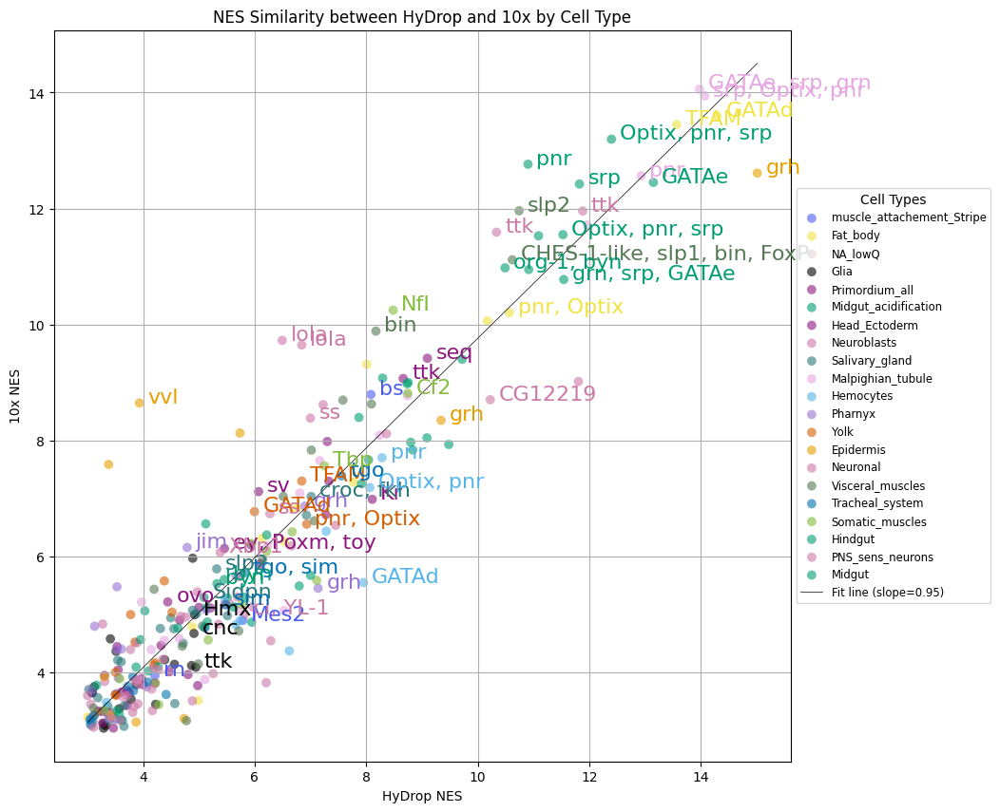

In [59]:
plt.figure(figsize=(10, 10))

all_x_vals = []
all_y_vals = []

# Define the offset (2 mm converted to data units)
offset = 0.15  # You may need to adjust this depending on the scale of your data

for cell_type in nes_scores_hydrop:
    if cell_type in nes_scores_10x:
        # Extract data for scatter plot
        x_vals = []
        y_vals = []
        motifs = []
        direct_annots = []
        for motif in nes_scores_hydrop[cell_type]:
            if motif in nes_scores_10x[cell_type]:
                x_vals.append(nes_scores_hydrop[cell_type][motif])
                y_vals.append(nes_scores_10x[cell_type][motif])
                motifs.append(motif)
                direct_annots.append(annotations_hydrop[cell_type][motif])

        all_x_vals.extend(x_vals)
        all_y_vals.extend(y_vals)

        plt.scatter(x_vals, y_vals, label=cell_type, color=colors.get(cell_type, '#333333'), alpha=0.6, s=50, marker='o', edgecolors='none')

        # Filter out NaN annotations
        valid_indices = [i for i in range(len(direct_annots)) if pd.notna(direct_annots[i])]

        # Select the top 3 motifs based on NES score for annotation
        if len(valid_indices) > 0:
            top_10_indices = sorted(valid_indices, key=lambda i: max(x_vals[i], y_vals[i]), reverse=True)[:3]
            for i in top_10_indices:
                plt.text(x_vals[i] + offset, y_vals[i], direct_annots[i], fontsize=16, color=colors.get(cell_type, '#333333'), alpha=1)

# Calculate the linear fit
slope, intercept = np.polyfit(all_x_vals, all_y_vals, 1)
x_fit = np.array([min(all_x_vals), max(all_x_vals)])
y_fit = slope * x_fit + intercept

# Plot the linear fit line
plt.plot(x_fit, y_fit, color='black', linestyle='-', linewidth=0.5, label=f'Fit line (slope={slope:.2f})')

# Customize the plot
plt.xlabel('HyDrop NES')
plt.ylabel('10x NES')
plt.title('NES Similarity between HyDrop and 10x by Cell Type')
plt.legend(title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.grid(True)

# Save the plot with adjustments to avoid cutting off the legend
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_correlation_per_celltype_top1000_DARs_10x_HyDrop_top_3TFs_TF.pdf", dpi=300, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

## comparison to sciATAC

In [78]:
sciATACdir = '/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/sci_ATAC/pycistarget/'

In [79]:
def extract_nes_scores(directory):
    nes_scores = {}
    annotations = {}
    for filename in os.listdir(directory):
        if filename.endswith(".tsv"):
            # Read the TSV file
            df = pd.read_csv(os.path.join(directory, filename), sep='\t', index_col=0)
            for _, row in df.iterrows():
                motif = row.name  # Motif information is in the index
                region_set = row['Region_set']  # Cell type information in the 'Region_set' column
                nes = row['NES']  # NES score
                direct_annot = row['Direct_annot']  # Direct annotation

                if region_set not in nes_scores:
                    nes_scores[region_set] = {}
                    annotations[region_set] = {}
                
                nes_scores[region_set][motif] = nes
                annotations[region_set][motif] = direct_annot
    return nes_scores, annotations

In [80]:
nes_scores_sciatac, annotations_sciatac = extract_nes_scores(sciATACdir)

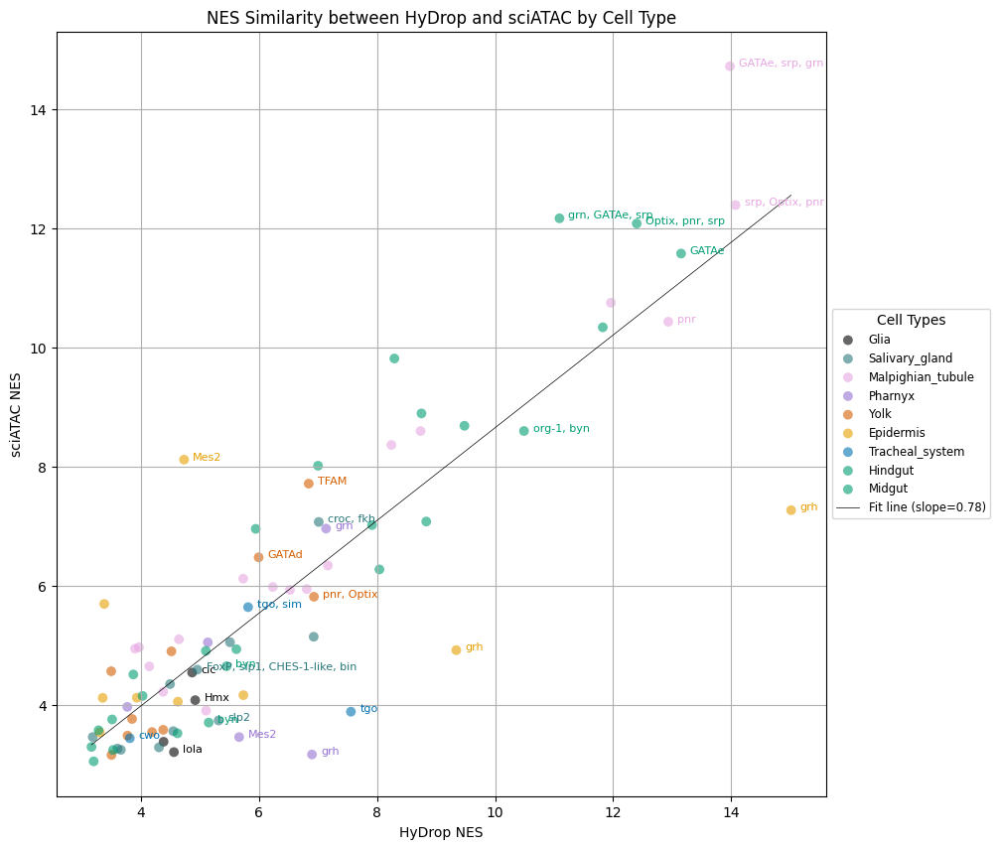

In [81]:
plt.figure(figsize=(10, 10))

all_x_vals = []
all_y_vals = []

# Define the offset (2 mm converted to data units)
offset = 0.15  # You may need to adjust this depending on the scale of your data

for cell_type in nes_scores_hydrop:
    if cell_type in nes_scores_sciatac:
        # Extract data for scatter plot
        x_vals = []
        y_vals = []
        motifs = []
        direct_annots = []
        for motif in nes_scores_hydrop[cell_type]:
            if motif in nes_scores_sciatac[cell_type]:
                x_vals.append(nes_scores_hydrop[cell_type][motif])
                y_vals.append(nes_scores_sciatac[cell_type][motif])
                motifs.append(motif)
                direct_annots.append(annotations_hydrop[cell_type][motif])

        all_x_vals.extend(x_vals)
        all_y_vals.extend(y_vals)

        plt.scatter(x_vals, y_vals, label=cell_type, color=colors.get(cell_type, '#333333'), alpha=0.6, s=50, marker='o', edgecolors='none')

        # Filter out NaN annotations
        valid_indices = [i for i in range(len(direct_annots)) if pd.notna(direct_annots[i])]

        # Select the top 3 motifs based on NES score for annotation
        if len(valid_indices) > 0:
            top_10_indices = sorted(valid_indices, key=lambda i: max(x_vals[i], y_vals[i]), reverse=True)[:3]
            for i in top_10_indices:
                plt.text(x_vals[i] + offset, y_vals[i], direct_annots[i], fontsize=8, color=colors.get(cell_type, '#333333'), alpha=1)

# Calculate the linear fit
slope, intercept = np.polyfit(all_x_vals, all_y_vals, 1)
x_fit = np.array([min(all_x_vals), max(all_x_vals)])
y_fit = slope * x_fit + intercept

# Plot the linear fit line
plt.plot(x_fit, y_fit, color='black', linestyle='-', linewidth=0.5, label=f'Fit line (slope={slope:.2f})')

# Customize the plot
plt.xlabel('HyDrop NES')
plt.ylabel('sciATAC NES')
plt.title('NES Similarity between HyDrop and sciATAC by Cell Type')
plt.legend(title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.grid(True)

# Save the plot with adjustments to avoid cutting off the legend
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_correlation_per_celltype_top1000_DARs_sciATAC_HyDrop_top_3TFs_added.pdf", dpi=300, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

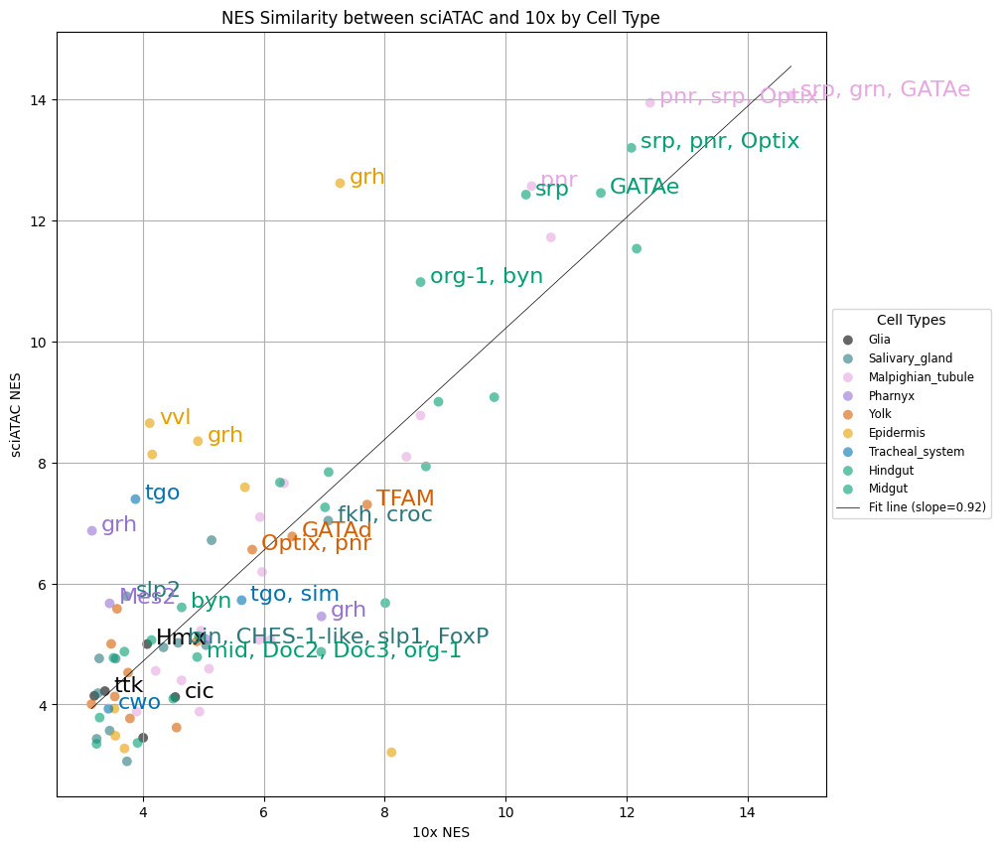

In [85]:
plt.figure(figsize=(10, 10))

all_x_vals = []
all_y_vals = []

# Define the offset (2 mm converted to data units)
offset = 0.15  # You may need to adjust this depending on the scale of your data

for cell_type in nes_scores_sciatac:
    if cell_type in nes_scores_10x:
        # Extract data for scatter plot
        x_vals = []
        y_vals = []
        motifs = []
        direct_annots = []
        for motif in nes_scores_sciatac[cell_type]:
            if motif in nes_scores_10x[cell_type]:
                x_vals.append(nes_scores_sciatac[cell_type][motif])
                y_vals.append(nes_scores_10x[cell_type][motif])
                motifs.append(motif)
                direct_annots.append(annotations_10x[cell_type][motif])

        all_x_vals.extend(x_vals)
        all_y_vals.extend(y_vals)

        plt.scatter(x_vals, y_vals, label=cell_type, color=colors.get(cell_type, '#333333'), alpha=0.6, s=50,marker='o', edgecolors='none')

        # Filter out NaN annotations
        valid_indices = [i for i in range(len(direct_annots)) if pd.notna(direct_annots[i])]

        # Select the top 3 motifs based on NES score for annotation
        if len(valid_indices) > 0:
            top_10_indices = sorted(valid_indices, key=lambda i: max(x_vals[i], y_vals[i]), reverse=True)[:3]
            for i in top_10_indices:
                plt.text(x_vals[i] + offset, y_vals[i], direct_annots[i], fontsize=16, color=colors.get(cell_type, '#333333'), alpha=1)

# Calculate the linear fit
slope, intercept = np.polyfit(all_x_vals, all_y_vals, 1)
x_fit = np.array([min(all_x_vals), max(all_x_vals)])
y_fit = slope * x_fit + intercept

# Plot the linear fit line
plt.plot(x_fit, y_fit, color='black', linestyle='-', linewidth=0.5, label=f'Fit line (slope={slope:.2f})')

# Customize the plot
plt.xlabel('10x NES')
plt.ylabel('sciATAC NES')
plt.title('NES Similarity between sciATAC and 10x by Cell Type')
plt.legend(title="Cell Types", loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.grid(True)

# Save the plot with adjustments to avoid cutting off the legend
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_correlation_per_celltype_top1000_DARs_sciATAC_10x_top_3TFs_added.pdf", dpi=500, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

In [23]:
list(nes_scores_10x.keys())

['muscle_attachement_Stripe',
 'Fat_body',
 'NA_lowQ',
 'Glia',
 'Primordium_all',
 'Midgut_acidification',
 'Head_Ectoderm',
 'Neuroblasts',
 'Salivary_gland',
 'Malpighian_tubule',
 'Hemocytes',
 'Pharnyx',
 'Yolk',
 'Epidermis',
 'Neuronal',
 'Visceral_muscles',
 'Tracheal_system',
 'Somatic_muscles',
 'Hindgut',
 'PNS_sens_neurons',
 'Midgut']

when comparing 10x to sciATAC NES as scatterplot, the correlation is worse (0.78) then what we see in 10x comparison to HyDrop (0.95)

In [24]:
list(nes_scores_sciatac.keys())

['Amnioserosa',
 'Glia',
 'Head_ectoderm',
 'Plasmatocytes',
 'Somatic_muscle',
 'Visceral_muscle',
 'Salivary_gland',
 'Brain',
 'Malpighian_tubule',
 'PNS_sense',
 'Pharnyx',
 'Yolk',
 'Epidermis',
 'Tracheal_system',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 'Hindgut',
 'VNC',
 'Midgut',
 'Fatbody']

In [25]:
list(set(nes_scores_sciatac.keys()) & set(nes_scores_10x.keys()))

['Pharnyx',
 'Tracheal_system',
 'Glia',
 'Hindgut',
 'Yolk',
 'Midgut',
 'Salivary_gland',
 'Epidermis',
 'Malpighian_tubule']

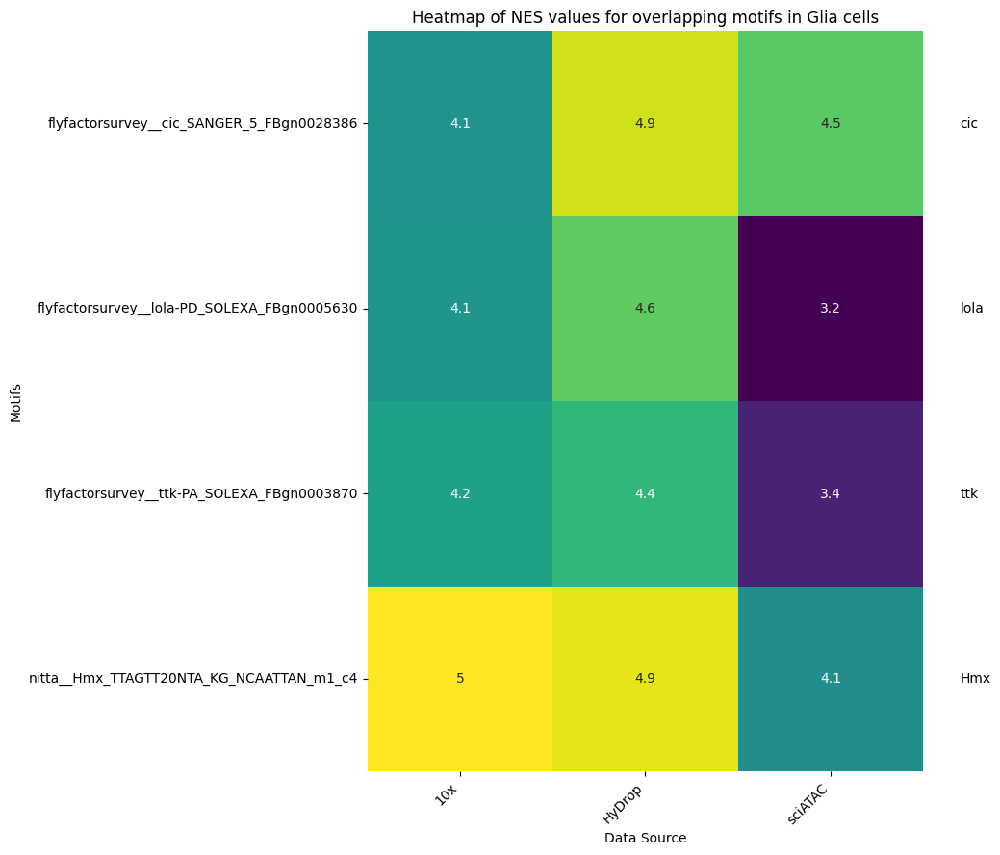

In [27]:

# Define the specific Region_set we are interested in
region_set = 'Glia'

# Extract motifs for the specific Region_set from both datasets
motifs_10x = set(nes_scores_10x.get(region_set, {}).keys())
motifs_hydrop = set(nes_scores_hydrop.get(region_set, {}).keys())
motifs_sciatac = set(nes_scores_sciatac.get(region_set, {}).keys())


# Find the intersection of the two sets (overlapping motifs)
overlapping_motifs = motifs_10x & motifs_hydrop & motifs_sciatac

# Initialize a DataFrame to store NES values and annotations
heatmap_data = pd.DataFrame(index=sorted(overlapping_motifs), columns=['10x', 'HyDrop', 'sciATAC'])
annotations = pd.DataFrame(index=sorted(overlapping_motifs), columns=['Direct_annot'])

# Populate the DataFrames with NES values and annotations
for motif in overlapping_motifs:
    heatmap_data.loc[motif, '10x'] = nes_scores_10x[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'HyDrop'] = nes_scores_hydrop[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'sciATAC'] = nes_scores_sciatac[region_set].get(motif, float('nan'))
    annotations.loc[motif, 'Direct_annot'] = annotations_hydrop[region_set].get(motif, float('nan'))

# Filter out rows where Direct_annot is NaN
valid_annotations = annotations.dropna()

# Keep only those motifs in the heatmap_data
heatmap_data_filtered = heatmap_data.loc[valid_annotations.index]

# Convert the DataFrame to float
heatmap_data_filtered = heatmap_data_filtered.astype(float)

# Plot the heatmap without the color bar (legend)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(heatmap_data_filtered, annot=True, cmap='viridis', cbar=False, square=True, ax=ax)
plt.title('Heatmap of NES values for overlapping motifs in Glia cells')
plt.xlabel('Data Source')
plt.ylabel('Motifs')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add the annotations as a separate text column
for i, motif in enumerate(heatmap_data_filtered.index):
    annot_text = valid_annotations.loc[motif, 'Direct_annot']
    ax.text(3.2, i + 0.5, annot_text, va='center', ha='left', fontsize=10, color='black')

plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_heatmap_top1000_DARs_10x_HyDrop_sciATAC_glae.png", dpi=500, bbox_inches='tight', pad_inches=0.2)

plt.show()


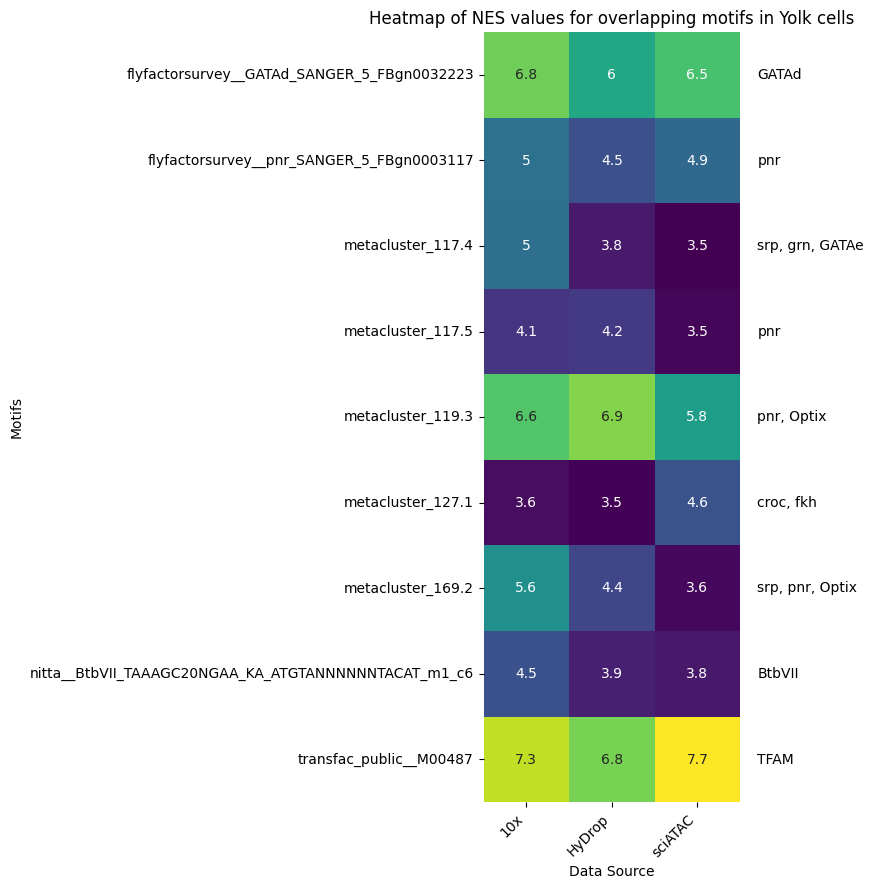

In [30]:

# Define the specific Region_set we are interested in
region_set = 'Yolk'

# Extract motifs for the specific Region_set from both datasets
motifs_10x = set(nes_scores_10x.get(region_set, {}).keys())
motifs_hydrop = set(nes_scores_hydrop.get(region_set, {}).keys())
motifs_sciatac = set(nes_scores_sciatac.get(region_set, {}).keys())


# Find the intersection of the two sets (overlapping motifs)
overlapping_motifs = motifs_10x & motifs_hydrop & motifs_sciatac

# Initialize a DataFrame to store NES values and annotations
heatmap_data = pd.DataFrame(index=sorted(overlapping_motifs), columns=['10x', 'HyDrop', 'sciATAC'])
annotations = pd.DataFrame(index=sorted(overlapping_motifs), columns=['Direct_annot'])

# Populate the DataFrames with NES values and annotations
for motif in overlapping_motifs:
    heatmap_data.loc[motif, '10x'] = nes_scores_10x[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'HyDrop'] = nes_scores_hydrop[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'sciATAC'] = nes_scores_sciatac[region_set].get(motif, float('nan'))
    annotations.loc[motif, 'Direct_annot'] = annotations_hydrop[region_set].get(motif, float('nan'))

# Filter out rows where Direct_annot is NaN
valid_annotations = annotations.dropna()

# Keep only those motifs in the heatmap_data
heatmap_data_filtered = heatmap_data.loc[valid_annotations.index]

# Convert the DataFrame to float
heatmap_data_filtered = heatmap_data_filtered.astype(float)

# Plot the heatmap without the color bar (legend)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(heatmap_data_filtered, annot=True, cmap='viridis', cbar=False, square=True, ax=ax)
plt.title('Heatmap of NES values for overlapping motifs in Yolk cells')
plt.xlabel('Data Source')
plt.ylabel('Motifs')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add the annotations as a separate text column
for i, motif in enumerate(heatmap_data_filtered.index):
    annot_text = valid_annotations.loc[motif, 'Direct_annot']
    ax.text(3.2, i + 0.5, annot_text, va='center', ha='left', fontsize=10, color='black')

plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_heatmap_top1000_DARs_10x_HyDrop_sciATAC_Yolk.png", dpi=500, bbox_inches='tight', pad_inches=0.2)

plt.show()


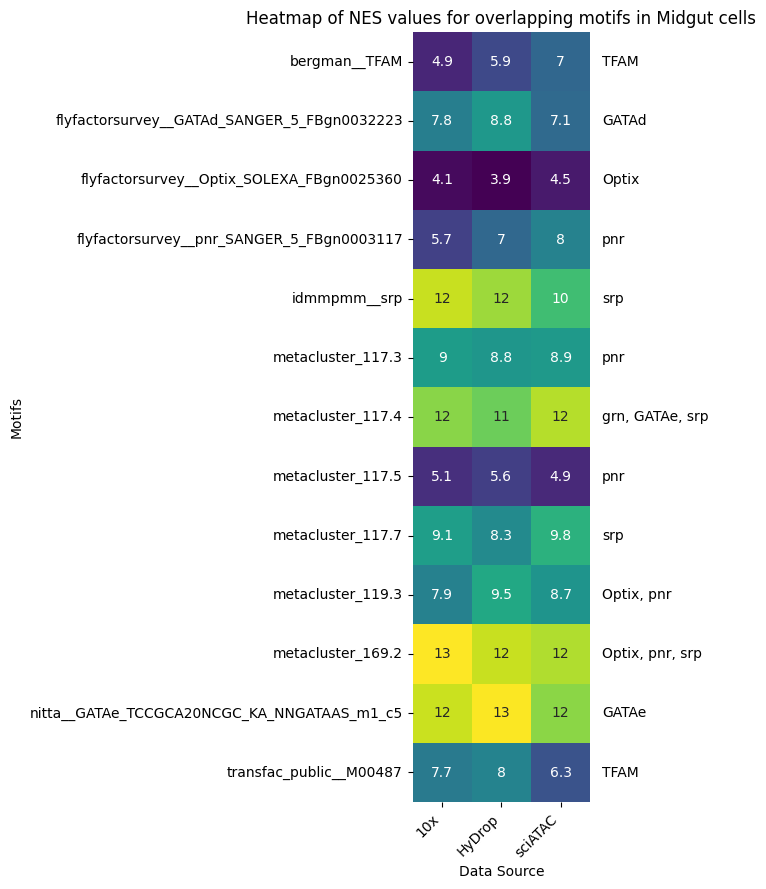

In [31]:

# Define the specific Region_set we are interested in
region_set = 'Midgut'

# Extract motifs for the specific Region_set from both datasets
motifs_10x = set(nes_scores_10x.get(region_set, {}).keys())
motifs_hydrop = set(nes_scores_hydrop.get(region_set, {}).keys())
motifs_sciatac = set(nes_scores_sciatac.get(region_set, {}).keys())


# Find the intersection of the two sets (overlapping motifs)
overlapping_motifs = motifs_10x & motifs_hydrop & motifs_sciatac

# Initialize a DataFrame to store NES values and annotations
heatmap_data = pd.DataFrame(index=sorted(overlapping_motifs), columns=['10x', 'HyDrop', 'sciATAC'])
annotations = pd.DataFrame(index=sorted(overlapping_motifs), columns=['Direct_annot'])

# Populate the DataFrames with NES values and annotations
for motif in overlapping_motifs:
    heatmap_data.loc[motif, '10x'] = nes_scores_10x[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'HyDrop'] = nes_scores_hydrop[region_set].get(motif, float('nan'))
    heatmap_data.loc[motif, 'sciATAC'] = nes_scores_sciatac[region_set].get(motif, float('nan'))
    annotations.loc[motif, 'Direct_annot'] = annotations_hydrop[region_set].get(motif, float('nan'))

# Filter out rows where Direct_annot is NaN
valid_annotations = annotations.dropna()

# Keep only those motifs in the heatmap_data
heatmap_data_filtered = heatmap_data.loc[valid_annotations.index]

# Convert the DataFrame to float
heatmap_data_filtered = heatmap_data_filtered.astype(float)

# Plot the heatmap without the color bar (legend)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(heatmap_data_filtered, annot=True, cmap='viridis', cbar=False, square=True, ax=ax)
plt.title('Heatmap of NES values for overlapping motifs in Midgut cells')
plt.xlabel('Data Source')
plt.ylabel('Motifs')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add the annotations as a separate text column
for i, motif in enumerate(heatmap_data_filtered.index):
    annot_text = valid_annotations.loc[motif, 'Direct_annot']
    ax.text(3.2, i + 0.5, annot_text, va='center', ha='left', fontsize=10, color='black')

plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/NES_heatmap_top1000_DARs_10x_HyDrop_sciATAC_Midgut.png", dpi=500, bbox_inches='tight', pad_inches=0.2)

plt.show()


TFmoDisco results: `/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/CREsted/modisco_results_combined_shared_regions/combined_modisco_results`

In [1]:
import h5py

In [2]:
path = "/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/CREsted/modisco_results_combined_shared_regions/combined_modisco_results/Epidermis_HyDrop_modisco_results.h5"

In [3]:
with h5py.File(path, "r") as f:
    def print_structure(name, obj):
        print(name)
    f.visititems(print_structure)

neg_patterns
neg_patterns/pattern_0
neg_patterns/pattern_0/contrib_scores
neg_patterns/pattern_0/hypothetical_contribs
neg_patterns/pattern_0/seqlets
neg_patterns/pattern_0/seqlets/contrib_scores
neg_patterns/pattern_0/seqlets/end
neg_patterns/pattern_0/seqlets/example_idx
neg_patterns/pattern_0/seqlets/hypothetical_contribs
neg_patterns/pattern_0/seqlets/is_revcomp
neg_patterns/pattern_0/seqlets/n_seqlets
neg_patterns/pattern_0/seqlets/sequence
neg_patterns/pattern_0/seqlets/start
neg_patterns/pattern_0/sequence
neg_patterns/pattern_0/subpattern_0
neg_patterns/pattern_0/subpattern_0/contrib_scores
neg_patterns/pattern_0/subpattern_0/hypothetical_contribs
neg_patterns/pattern_0/subpattern_0/seqlets
neg_patterns/pattern_0/subpattern_0/seqlets/contrib_scores
neg_patterns/pattern_0/subpattern_0/seqlets/end
neg_patterns/pattern_0/subpattern_0/seqlets/example_idx
neg_patterns/pattern_0/subpattern_0/seqlets/hypothetical_contribs
neg_patterns/pattern_0/subpattern_0/seqlets/is_revcomp
neg_patt

In [4]:
import pandas as pd
import h5py

motif_info = []

with h5py.File(path, "r") as f:
    patterns = f["pos_patterns/pattern_0/seqlets_to_patterns_result/patterns"]
    
    for pattern_name in patterns:
        group = patterns[pattern_name]
        
        # Extract information
        num_seqlets = group["seqlets"].shape[0] if "seqlets" in group else 0
        try:
            contrib_scores = group["contrib_scores"]["profile"][:]
            contrib_sum = contrib_scores.sum()
        except KeyError:
            contrib_sum = float("nan")
        
        motif_info.append({
            "motif_id": pattern_name,
            "num_seqlets": num_seqlets,
            "contrib_score_sum": contrib_sum
        })

# Save to TSV
df = pd.DataFrame(motif_info)
#df.to_csv("modisco_motifs_summary.tsv", sep="\t", index=False)


KeyError: 'Unable to synchronously open object (component not found)'

# sciATAC

180 topics

In [11]:
#after models - models are submitted
# Load cisTopic object
import pickle
infile = open('/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/sci_ATAC/cistopic_objs/cistopic_obj_sciATAC_16_20hAEL_16072024_180topics.pkl', 'rb')
cistopic_obj_sciATAC = pickle.load(infile)
infile.close()

FileNotFoundError: [Errno 2] No such file or directory: '/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/sci_ATAC/cistopic_objs/cistopic_obj_sciATAC_16_20hAEL_16072024_180topics.pkl'

In [64]:
import gzip
import pickle

# Define the path to the gzipped pickle file
gzip_pickle_path = '/lustre1/project/stg_00002/lcb/hydrop_v2_paper/fly/sci_ATAC/cistopic_objs/cistopic_obj_sciATAC_16_20hAEL_16072024_180topics.pkl.gz'

# Open and load the gzipped pickle file
with gzip.open(gzip_pickle_path, 'rb') as infile:
    cistopic_obj_sciATAC = pickle.load(infile)

In [13]:
cistopic_obj_sciATAC.cell_data.columns

Index(['cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc',
       'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank',
       'total_fragments_count', 'log10_total_fragments_count',
       'unique_fragments_count', 'log10_unique_fragments_count',
       'total_fragments_in_peaks_count',
       'log10_total_fragments_in_peaks_count',
       'unique_fragments_in_peaks_count',
       'log10_unique_fragments_in_peaks_count',
       'fraction_of_fragments_in_peaks', 'duplication_count',
       'duplication_ratio', 'tss_enrichment', 'pdf_values_for_tss_enrichment',
       'pdf_values_for_fraction_of_fragments_in_peaks',
       'pdf_values_for_duplication_ratio', 'barcode',
       'Doublet_scores_fragments', 'Predicted_doublets_fragments',
       'pycisTopic_leiden_10_1.2', 'embryo_annotations',
       'embyro_annotations_paper'],
      dtype='object')

In [4]:
cistopic_obj_sciATAC.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,tss_enrichment,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode,Doublet_scores_fragments,Predicted_doublets_fragments,pycisTopic_leiden_10_1.2,embryo_annotations,embyro_annotations_paper
AATGCTCTGAAATACCTGCCCCAATTCCATCGCCGGTATG-exp1_hrs16-20_b1___exp1_hrs16-20_b1,22941,4.360612,18357,4.263802,exp1_hrs16-20_b1,4197,37316,4.571907,27606,4.441019,...,2.552946,0.029642,0.254124,0.760477,AATGCTCTGAAATACCTGCCCCAATTCCATCGCCGGTATG,0.143734,False,1,Somatic muscle,Somatic_muscle
TGGTTACGCTAATACCTGCCGTTCGAGGCGATTCATCGCC-exp1_hrs16-20_b1___exp1_hrs16-20_b1,25908,4.413434,20497,4.31169,exp1_hrs16-20_b1,3699,40116,4.603328,30175,4.479662,...,2.319952,0.009050,0.472196,0.702251,TGGTTACGCTAATACCTGCCGTTCGAGGCGATTCATCGCC,0.135294,False,1,Somatic muscle,Somatic_muscle
CTGGATGCCACCGAAGGTTATCTCATTGCCAATGCAGCGG-exp1_hrs16-20_b1___exp1_hrs16-20_b1,50760,4.705522,29208,4.465502,exp1_hrs16-20_b1,1444,72400,4.859745,55297,4.742709,...,3.156583,0.022441,0.145176,0.235934,CTGGATGCCACCGAAGGTTATCTCATTGCCAATGCAGCGG,0.09964,False,2,Somatic muscle,Somatic_muscle
GCGGTCAGAGTCCAATGGTTAATATAGCGGCGCCGGTATG-exp1_hrs16-20_b1___exp1_hrs16-20_b1,4566,3.659536,4228,3.626135,exp1_hrs16-20_b1,22609,7057,3.848682,5040,3.702517,...,3.316492,0.097378,1.422830,0.941383,GCGGTCAGAGTCCAATGGTTAATATAGCGGCGCCGGTATG,0.044248,False,9,Ventral nerve cord,VNC
GTTCGGCCTTAGCATACGGCCCAATTCCATGCAGCAGCTA-exp1_hrs16-20_b1___exp1_hrs16-20_b1,97917,4.990858,43213,4.635614,exp1_hrs16-20_b1,426,136939,5.136530,102720,5.011659,...,3.247687,0.007704,0.067948,0.108231,GTTCGGCCTTAGCATACGGCCCAATTCCATGCAGCAGCTA,0.12605,False,19,NaN,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCATCAGAACGGACTGGCCTTCTAATCCGGTACGATTCT-exp2_hrs16-20_b1___exp2_hrs16-20_b1,994,2.997386,961,2.982723,exp2_hrs16-20_b1,11607,2046,3.311118,1439,3.158362,...,5.228205,0.003216,0.615458,1.017663,ATCATCAGAACGGACTGGCCTTCTAATCCGGTACGATTCT,0.075051,False,23,Amnioserosa,Amnioserosa
TCTCGAAGGCGCATTAGGCGACCAGTTCAGGCAGCAGCTA-exp2_hrs16-20_b1___exp2_hrs16-20_b1,2142,3.330819,1937,3.28713,exp2_hrs16-20_b1,10208,3558,3.551328,2200,3.342620,...,3.642508,0.068289,1.385559,0.806324,TCTCGAAGGCGCATTAGGCGACCAGTTCAGGCAGCAGCTA,0.069873,False,3,Yolk,Yolk
GCGCAGGCGATGACGCGACCTGGCCGTCTTTCAATTCAAC-exp2_hrs16-20_b1___exp2_hrs16-20_b1,1848,3.266702,1741,3.240799,exp2_hrs16-20_b1,10320,2814,3.449478,2135,3.329601,...,2.901960,0.115370,1.522585,0.205045,GCGCAGGCGATGACGCGACCTGGCCGTCTTTCAATTCAAC,0.048523,False,3,Yolk,Yolk
GTATAAGGCATAATTCCGGTCTTCAGTAGTGCAGCAGCTA-exp2_hrs16-20_b1___exp2_hrs16-20_b1,3174,3.501607,2974,3.473341,exp2_hrs16-20_b1,7693,6681,3.824906,4186,3.621903,...,2.206060,0.032888,0.894798,1.032148,GTATAAGGCATAATTCCGGTCTTCAGTAGTGCAGCAGCTA,0.075051,False,3,Yolk,Yolk


In [14]:
print(cistopic_obj_sciATAC)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 61480 × 67162


In [61]:
cistopic_obj_sciATAC.cell_data.columns

Index(['cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc',
       'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank',
       'total_fragments_count', 'log10_total_fragments_count',
       'unique_fragments_count', 'log10_unique_fragments_count',
       'total_fragments_in_peaks_count',
       'log10_total_fragments_in_peaks_count',
       'unique_fragments_in_peaks_count',
       'log10_unique_fragments_in_peaks_count',
       'fraction_of_fragments_in_peaks', 'duplication_count',
       'duplication_ratio', 'tss_enrichment', 'pdf_values_for_tss_enrichment',
       'pdf_values_for_fraction_of_fragments_in_peaks',
       'pdf_values_for_duplication_ratio', 'barcode',
       'Doublet_scores_fragments', 'Predicted_doublets_fragments',
       'pycisTopic_leiden_10_1.2', 'embryo_annotations',
       'embyro_annotations_paper'],
      dtype='object')

In [59]:
sample_counts = cistopic_obj_sciATAC.cell_data['sample_id'].value_counts().to_dict()
print(sample_counts)

{'exp1_hrs16-20_b1': 49580, 'exp2_hrs16-20_b1': 11900}


In [62]:
sample_counts = cistopic_obj_sciATAC.cell_data['embyro_annotations_paper'].value_counts().to_dict()
print(sample_counts)

{'Epidermis': 9394, 'VNC': 9124, 'Somatic_muscle': 8916, 'Midgut': 6355, 'Yolk': 4028, 'Tracheal_system': 2791, 'Pharnyx': 2729, 'Visceral_muscle': 2668, 'PNS_sense': 2347, 'Fatbody': 1910, 'Brain': 1861, 'Malpighian_tubule': 1759, 'Hindgut': 1285, 'Glia': 1247, 'Head_ectoderm': 1153, 'NA': 1060, 'Salivary_gland': 1041, 'Plasmatocytes': 1002, 'Amnioserosa': 810}


## color dict

In [65]:
color_dict_sci = {'embyro_annotations_paper':
                  {'Epidermis': '#E69F00', 
 'VNC': '#CC79A7', 
 'Somatic_muscle': '#84BC3D', 
 'Midgut': '#009E73', 
                   'Yolk': '#D55E00', 
 'Tracheal_system': '#0072B2', 
 'Pharnyx': '#9772D3', 
 'Visceral_muscle': '#547953', 
 'PNS_sense': '#CC79A7', 
 'Fatbody': '#F0E442', 
                   'Brain': '#CC79A7', 
 'Malpighian_tubule': '#E6A7E2', 
 'Hindgut': '#009E73', 
 'Glia': '#000000', 
 'Head_ectoderm': '#8B167D', 
 'NA': '#E0DADA', 
 'Salivary_gland': '#28787B', 
 'Plasmatocytes': '#56B4E9', 
 'Amnioserosa': '#8B167D'}}

In [66]:
color_embyro_annotations_paper ={'Epidermis': '#E69F00', 
 'VNC': '#CC79A7', 
 'Somatic_muscle': '#84BC3D', 
 'Midgut': '#009E73', 
                   'Yolk': '#D55E00', 
 'Tracheal_system': '#0072B2', 
 'Pharnyx': '#9772D3', 
 'Visceral_muscle': '#547953', 
 'PNS_sense': '#CC79A7', 
 'Fatbody': '#F0E442', 
                   'Brain': '#CC79A7', 
 'Malpighian_tubule': '#E6A7E2', 
 'Hindgut': '#009E73', 
 'Glia': '#000000', 
 'Head_ectoderm': '#8B167D', 
 'NA': '#E0DADA', 
 'Salivary_gland': '#28787B', 
 'Plasmatocytes': '#56B4E9', 
 'Amnioserosa': '#8B167D'}

## tSNE

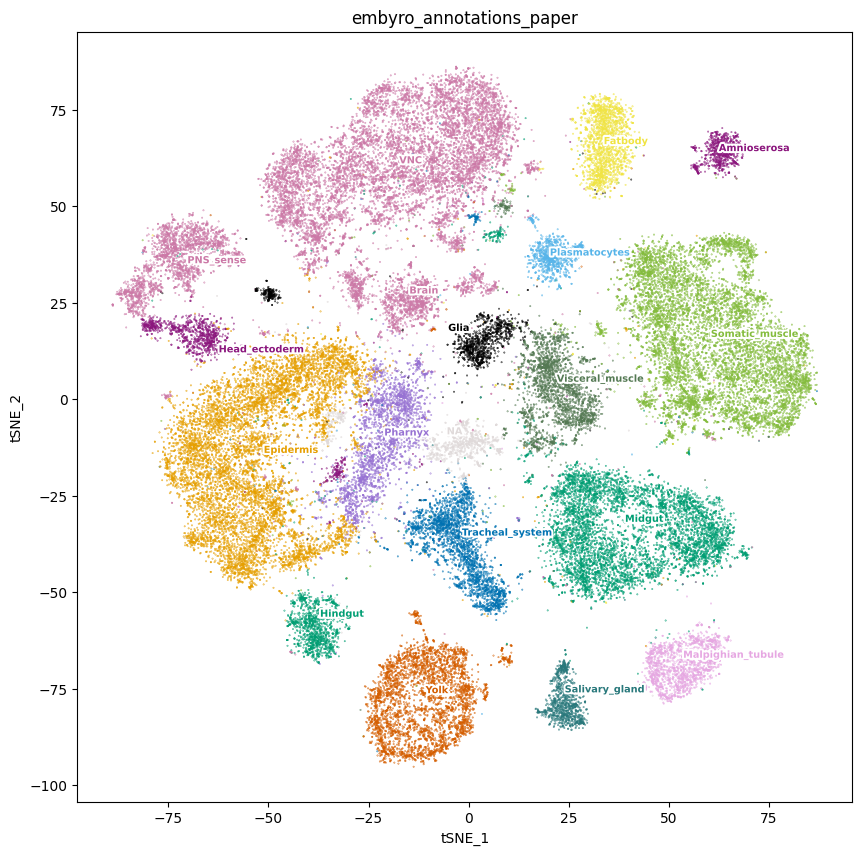

In [17]:
# model 120
plot_metadata(
    cistopic_obj_sciATAC,
    reduction_name='tSNE',
    variables=['embyro_annotations_paper'],
    target='cell', num_columns=1,figsize = (10,10),
    text_size=7,
    color_dictionary = color_dict_sci,
    dot_size=0.1)

In [67]:
coord = cistopic_obj_sciATAC.projections["cell"]["tSNE"]

In [68]:
colors = [color_embyro_annotations_paper[v] for v in cistopic_obj_sciATAC.cell_data['embyro_annotations_paper']]

In [69]:
index = np.arange(coord.shape[0])
random.shuffle(index)

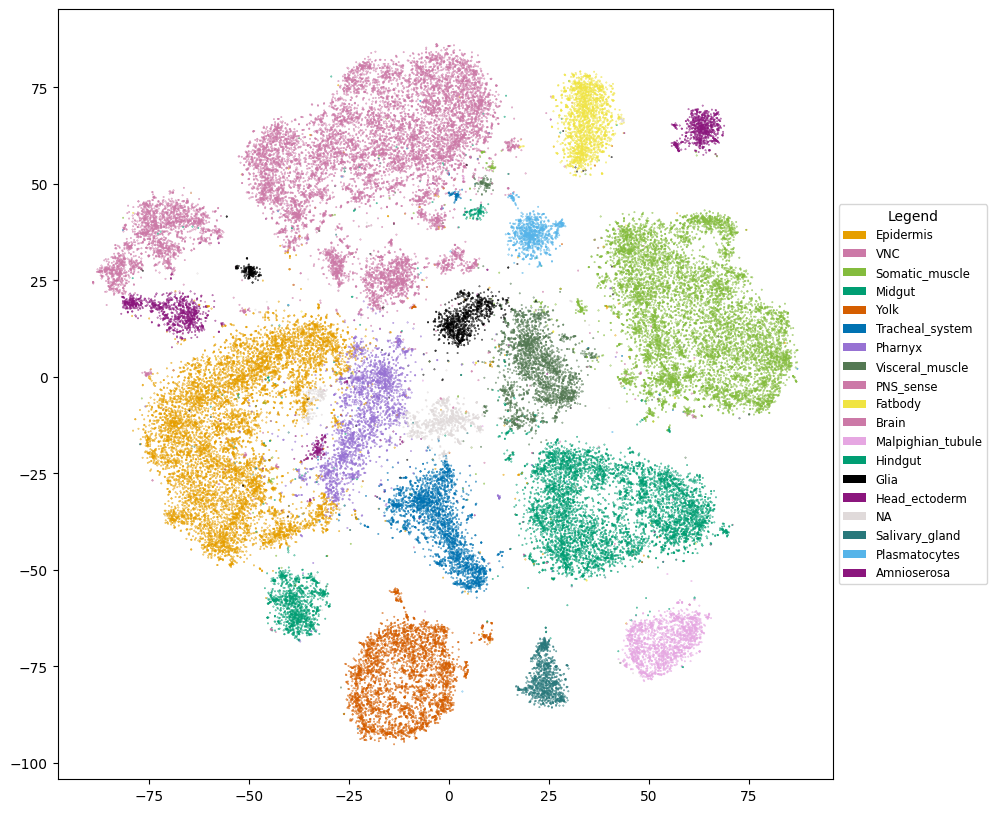

In [70]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(coord.iloc[index, 0], coord.iloc[index, 1], c=[colors[i] for i in index], s=0.1, alpha=1, rasterized=True)  # Using iloc for DataFrame indexing
legend_elements = [Patch(facecolor=color, label=label) for label, color in color_embyro_annotations_paper.items()]
ax.legend(handles=legend_elements, title="Legend", loc="center left", bbox_to_anchor=(1, 0.5), fontsize='small', title_fontsize='medium')
plt.savefig("/user/leuven/350/vsc35050/lcb/hydrop_v2_paper/figures_paper/fly/visualization_cistopic/tSNE_sciATAC_with_shuffling_celltypes.pdf", dpi=500, bbox_inches='tight', pad_inches=0.2)  # Save at 300 DPI for good quality
plt.show()